In [1]:
import os
import sys
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import statsmodels as sm
import statsmodels.formula.api as smf
from statsmodels.formula.api import ols, mixedlm

import time
from datetime import date

# updated src file changes are loaded
%load_ext autoreload
%autoreload 2

# load R language
os.environ["R_HOME"] = r"C:\Users\jacob\anaconda3\envs\water_current_project\Lib\R"
os.environ["PATH"] += r";C:\Users\jacob\anaconda3\envs\water_current_project\Lib\R\bin\x64"
%load_ext rpy2.ipython

from rpy2.robjects.packages import importr
lme4 = importr("lme4")

from rpy2.robjects import r
from rpy2.robjects import pandas2ri
pandas2ri.activate()




# ensures function files are visible: can use 'src.loading' for example
sys.path.append(os.path.abspath(".."))

C:\Users\jacob\anaconda3\envs\water_current_project\lib\site-packages\rpy2\robjects\packages.py:367: UserWarning: The symbol 'quartz' is not in this R namespace/package.
  warnings.warn(


In [ ]:
### SANBOX TESTING

### LOAD DATA

In [2]:

from src.loading import load_data

# -------------------- 3.0 m/s
df_3 = load_data("../data/target_trial_3_2025_11_7.parquet",  keep_col='training_status')
# ------------------- 2.0 m/s
df_2 = load_data("../data/target_trial_2.parquet")
# # drop every row from participant p030
df_2 = df_2[df_2['ppid'] != 'p030'].copy()


# ------------------- 3.5 m/s
df_35 = load_data("../data/target_trial_3_5.parquet", keep_col='training_status')

In [3]:
# combine dfs
df = pd.concat([df_2, df_3], ignore_index=True)


In [4]:
# make function to loop through ppid label, attatch a '_{water_speed} based on npunique(water_speed[1])
from src.label_water_speed_ppid import label_water_condtion_ppid


In [5]:
df = label_water_condtion_ppid(df, ppid_col='ppid', water_col='water_speed_m_s', selected_speeds=[-3.0,-2.0,0.0])


In [6]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 41165 entries, 0 to 41164
Data columns (total 61 columns):
 #   Column                     Non-Null Count  Dtype   
---  ------                     --------------  -----   
 0   experiment                 41165 non-null  object  
 1   ppid                       41165 non-null  object  
 2   session_num                41165 non-null  int32   
 3   trial_num                  41165 non-null  int32   
 4   block_num                  41165 non-null  int32   
 5   trial_num_in_block         41165 non-null  int32   
 6   start_time                 41165 non-null  float64 
 7   end_time                   41165 non-null  float64 
 8   hand                       41165 non-null  object  
 9   target_hit                 41165 non-null  object  
 10  final_ball_state           41165 non-null  object  
 11  type                       41165 non-null  object  
 12  target_position_x          41165 non-null  float64 
 13  target_position_y          4116

In [71]:
df['min_x_delta'] = (df['min_pos_from_target_x'] - df['target_position_x']) * 100
df['min_z_delta'] = (df['min_pos_from_target_z'] - df['target_position_z']) * 100


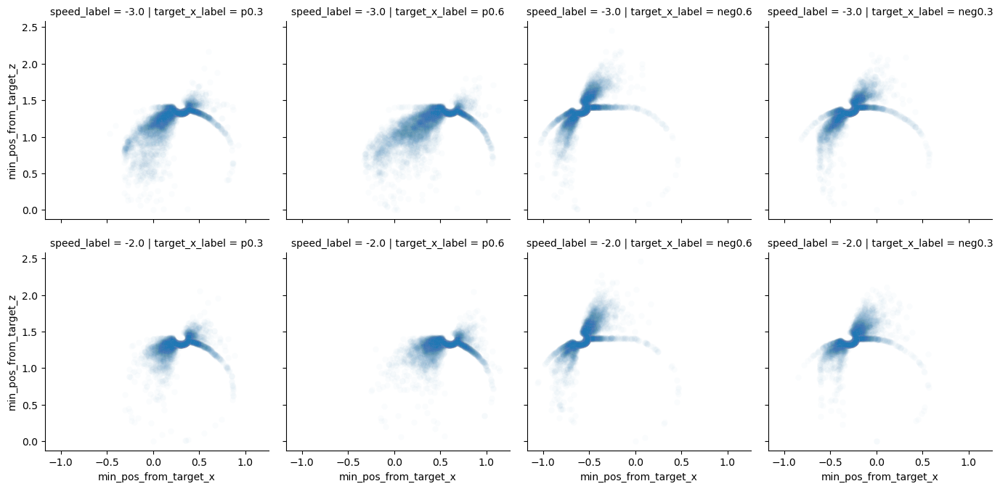

In [7]:
from src.plotting import plot_min_x_z

plot_min_x_z(df,
             c_col='target_x_label',
             r_col='speed_label'
            )

In [73]:
# order targets

from src.features import order_targets

df['target_x_label'] = order_targets(df.copy())

0          p0.3
1          p0.6
2        neg0.6
3        neg0.3
4        neg0.3
          ...  
41160      p0.3
41161      p0.3
41162    neg0.6
41163      p0.3
41164    neg0.6
Name: target_x_label, Length: 41165, dtype: category
Categories (4, object): ['neg0.6' < 'neg0.3' < 'p0.3' < 'p0.6']


In [74]:
from src.add_phases import label_phases, df_add_phases

phases = label_phases()

df = df_add_phases(df, phase_array=phases)


df_nf = df[~df['phase'].str.startswith('f')]

In [75]:
df_nf

,experiment,ppid,session_num,trial_num,block_num,trial_num_in_block,start_time,end_time,hand,target_hit,...,trial_num_target,target_x_label,training_status,sign,speed_label,speed_label_safe,ppid_full,min_x_delta,phase,min_z_delta
20,projectile_experiment,p000,1,21,6,1,177.7492,181.7450,r,True,...,6,p0.6,NaN,NaN,-2.0,neg2,p000_neg2,-5.4426,baseline,-6.4344
21,projectile_experiment,p000,1,22,6,2,181.7450,185.7824,r,False,...,6,neg0.3,NaN,NaN,-2.0,neg2,p000_neg2,15.1350,baseline,0.2436
22,projectile_experiment,p000,1,23,6,3,185.7824,207.2224,r,True,...,6,p0.3,NaN,NaN,-2.0,neg2,p000_neg2,3.4105,baseline,-7.8431
23,projectile_experiment,p000,1,24,6,4,207.2224,211.5381,r,True,...,6,neg0.6,NaN,NaN,-2.0,neg2,p000_neg2,2.8345,baseline,-7.7724
24,projectile_experiment,p000,1,25,7,1,211.5381,215.2137,r,True,...,7,p0.6,NaN,NaN,-2.0,neg2,p000_neg2,3.6160,baseline,-7.0947
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
41160,S2_3.0M-projectile_experiment 1,p050,1,492,233,2,1814.3530,1817.0610,r,False,...,122,p0.3,None,pos,-3.0,neg3,p050_neg3,-13.0329,washout_2,1.8420
41161,S2_3.0M-projectile_experiment 1,p050,1,493,234,1,1817.0610,1819.9770,r,True,...,123,p0.3,None,pos,-3.0,neg3,p050_neg3,3.6907,washout_2,-5.2061
41162,S2_3.0M-projectile_experiment 1,p050,1,494,234,2,1819.9770,1823.3790,r,True,...,123,neg0.6,None,neg,-3.0,neg3,p050_neg3,7.5684,washout_2,-3.3058
41163,S2_3.0M-projectile_experiment 1,p050,1,495,235,1,1823.3790,1826.4900,r,True,...,124,p0.3,None,pos,-3.0,neg3,p050_neg3,-7.7528,washout_2,-0.5432


### FILTERING

In [76]:
from src.cleaning import crossed_threshold

# make column checking if ball crossed 70.0 cm on z axis
df_nf['crossed_threshold'] = df_nf.apply(
    lambda row: crossed_threshold(row, col="ball_pos_z", val=0.70),
        axis=1
)
# check
print(df_nf['crossed_threshold'].value_counts())

crossed_threshold
True     39108
False      397
Name: count, dtype: int64


C:\Users\jacob\AppData\Local\Temp\ipykernel_16000\3599073393.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_nf['crossed_threshold'] = df_nf.apply(


In [78]:
# Make a seperate df without trials that did not cross threshold
df_filt = df_nf[df_nf['crossed_threshold']] # retains rows where crossed_threshold == True

In [88]:

from src.cleaning import extract_key_columns

df_small = extract_key_columns(df_nf)
df_small_filt = extract_key_columns(df_filt)


In [89]:
df_small_filt['phase_str'] = df_small_filt['phase'].astype(str)


In [90]:
df_small_filt.info()

<class 'pandas.core.frame.DataFrame'>
Index: 39108 entries, 20 to 41164
Data columns (total 26 columns):
 #   Column                  Non-Null Count  Dtype   
---  ------                  --------------  -----   
 0   ppid_full               39108 non-null  category
 1   speed_label             39108 non-null  category
 2   trial_num               39108 non-null  int32   
 3   phase                   39108 non-null  category
 4   trial_num_target        39108 non-null  int32   
 5   launch_deviation        39108 non-null  float64 
 6   launch_dev_z            39108 non-null  float64 
 7   launch_Speed            39108 non-null  float64 
 8   launch_Speed_z          39108 non-null  float64 
 9   ball_dist_to_center_cm  39108 non-null  float64 
 10  min_x_delta             39108 non-null  float64 
 11  min_z_delta             39108 non-null  float64 
 12  target_hit              39108 non-null  object  
 13  water_speed_binary      39108 non-null  int8    
 14  water_speed_m_s         39

In [91]:
### remove target and ball radii from distance measure
from src.cleaning import distance_target_ball_radii

df_small_filt['min_distance_fixed'] = distance_target_ball_radii(df_small_filt, y_col='ball_dist_to_center_cm')
df_small['min_distance_fixed'] = distance_target_ball_radii(df_small, y_col='ball_dist_to_center_cm')


df_small_filt[['min_distance_fixed','target_hit']]

,min_distance_fixed,target_hit
20,0.000001,True
21,6.344659,False
22,0.000001,True
23,0.000001,True
24,0.000001,True
...,...,...
41160,4.625844,False
41161,0.000001,True
41162,0.000001,True
41163,0.000001,True


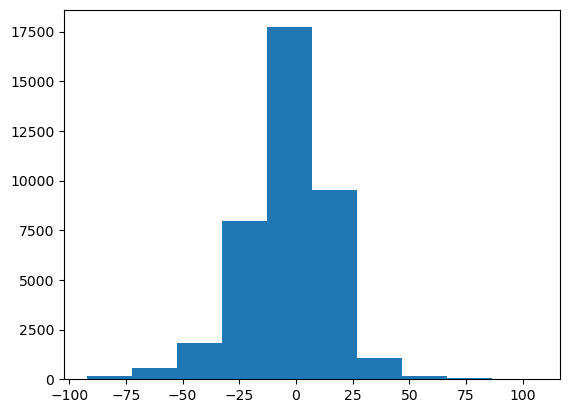

,ppid_full,speed_label,trial_num,phase,trial_num_target,launch_deviation,launch_dev_z,launch_Speed,launch_Speed_z,ball_dist_to_center_cm,...,ball_pos_z,min_pos_from_target_x,min_pos_from_target_z,target_position_x,target_position_z,target_angle_90,phase_str,ball_dist_to_center_cm_radii_fixed,min_distance_fixed,log_min_distance_fixed
20,p000_neg2,-2.0,21,baseline,6,0.980091,1.116641,1.442353,-1.458163,7.727737,...,0.000000_0.013353_0.026616_0.052881_0.065885_0...,0.545574,1.335656,0.6,1.4,66.801409,baseline,0.000001,0.000001,-13.815511
21,p000_neg2,-2.0,22,baseline,6,-6.044347,0.780783,1.175063,-1.846894,15.094659,...,0.000000_0.023307_0.034866_0.046363_0.069173_0...,-0.148650,1.402436,-0.3,1.4,102.094757,baseline,6.344659,6.344659,1.847613
22,p000_neg2,-2.0,23,baseline,6,-2.092893,0.969713,1.804944,-0.930832,7.815149,...,0.000000_0.034852_0.052061_0.086059_0.102852_0...,0.334105,1.321569,0.3,1.4,77.905243,baseline,0.000001,0.000001,-13.815511
23,p000_neg2,-2.0,24,baseline,6,0.181509,1.078458,1.761366,-0.994210,7.371344,...,0.000000_0.032203_0.048110_0.063889_0.095073_0...,-0.571655,1.322276,-0.6,1.4,113.198591,baseline,0.000001,0.000001,-13.815511
24,p000_neg2,-2.0,25,baseline,7,-2.379829,0.955994,1.969417,-0.691633,7.400935,...,0.000000_0.017764_0.035366_0.070098_0.087233_0...,0.636160,1.329053,0.6,1.4,66.801409,baseline,0.000001,0.000001,-13.815511
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
41160,p050_neg3,-3.0,492,washout_2,122,5.273447,1.331334,4.112829,1.173733,13.375844,...,0.000000_0.080898_0.120213_0.158808_0.233944_0...,0.169671,1.418420,0.3,1.4,77.905243,washout_2,4.625844,4.625844,1.531659
41161,p050_neg3,-3.0,493,washout_2,123,-1.938383,0.983130,4.617405,1.707477,5.145460,...,0.000000_0.088636_0.131562_0.173609_0.255213_0...,0.336907,1.347939,0.3,1.4,77.905243,washout_2,0.000001,0.000001,-13.815511
41162,p050_neg3,-3.0,494,washout_2,123,-2.213391,0.969851,2.782864,-0.233114,7.337979,...,0.000000_0.025983_0.076955_0.101961_0.126658_0...,-0.524316,1.366942,-0.6,1.4,113.198591,washout_2,0.000001,0.000001,-13.815511
41163,p050_neg3,-3.0,495,washout_2,124,3.030887,1.223058,3.364877,0.382543,7.570455,...,0.000000_0.065941_0.098152_0.129878_0.191932_0...,0.222472,1.394568,0.3,1.4,77.905243,washout_2,0.000001,0.000001,-13.815511


In [14]:
# log min distance fixed for future plotting
df_small_filt['log_min_distance_fixed'] = np.log(df_small_filt['min_distance_fixed'])

plt.hist(x=df_small_filt['min_x_delta'])
plt.show()

df_small_filt


In [115]:
df_small_filt.columns


Index(['ppid_full', 'speed_label', 'trial_num', 'phase', 'trial_num_target',
       'launch_deviation', 'launch_dev_z', 'launch_Speed', 'launch_Speed_z',
       'ball_dist_to_center_cm', 'min_x_delta', 'target_hit',
       'water_speed_binary', 'water_speed_m_s', 'target_x_label', 'sign_label',
       'set_order', 'ball_pos_x', 'ball_pos_z', 'min_pos_from_target_x',
       'min_pos_from_target_z', 'target_position_x', 'target_position_z',
       'target_angle_90', 'ball_dist_to_center_cm_radii_fixed',
       'min_distance_fixed'],
      dtype='object')

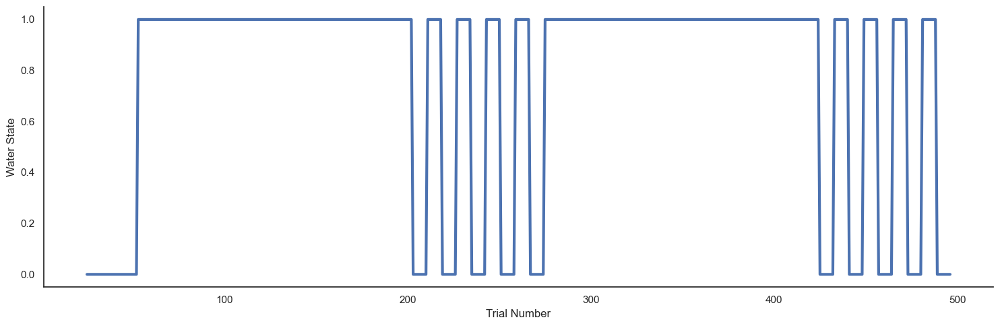

In [134]:
from src.plotting import plot_trial_schedule

# trial schedule plot
g = plot_trial_schedule(df_small, context='poster', font_scale=3)


In [92]:
from src.features import point_of_crossing_x

df_small['error_x_plane'] = df_small.apply(point_of_crossing_x, axis=1)
df_small_filt['error_x_plane'] = df_small.apply(point_of_crossing_x, axis=1)

#df_small_filt.to_csv(r"..\data\R_LMM.csv", index=False)

# calculate min point once, save data in function



In [94]:
df_small_filt.columns

Index(['ppid_full', 'speed_label', 'trial_num', 'phase', 'trial_num_target',
       'launch_deviation', 'launch_dev_z', 'launch_Speed', 'launch_Speed_z',
       'ball_dist_to_center_cm', 'min_x_delta', 'min_z_delta', 'target_hit',
       'water_speed_binary', 'water_speed_m_s', 'target_x_label', 'sign_label',
       'set_order', 'ball_pos_x', 'ball_pos_z', 'min_pos_from_target_x',
       'min_pos_from_target_z', 'target_position_x', 'target_position_z',
       'target_angle_90', 'phase_str', 'ball_dist_to_center_cm_radii_fixed',
       'min_distance_fixed', 'error_x_plane'],
      dtype='object')

In [17]:
from src.plotting import plot_density_targets

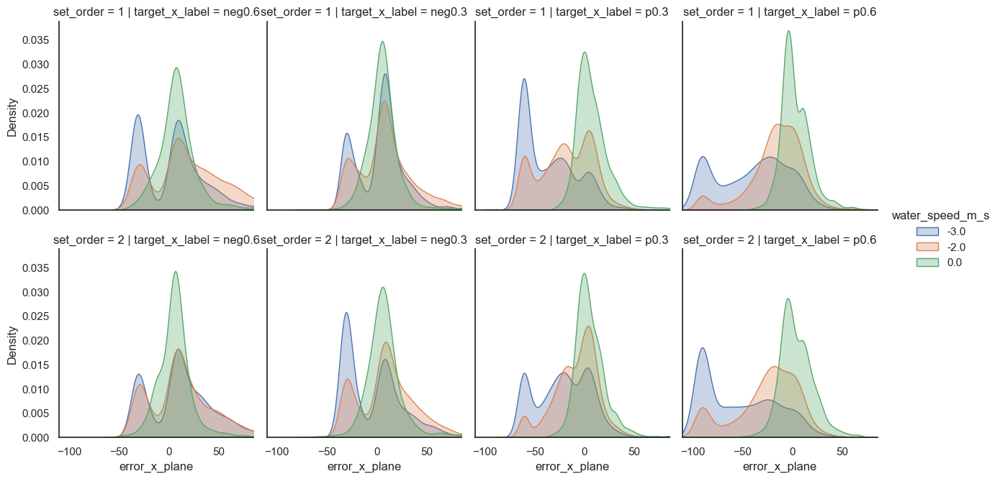

In [39]:
from src.plotting import plot_density_targets

plot_density_targets(df_small_filt,
                     x_lim=(-110,85),
                     x_col='error_x_plane',
                    cond_col='water_speed_m_s')

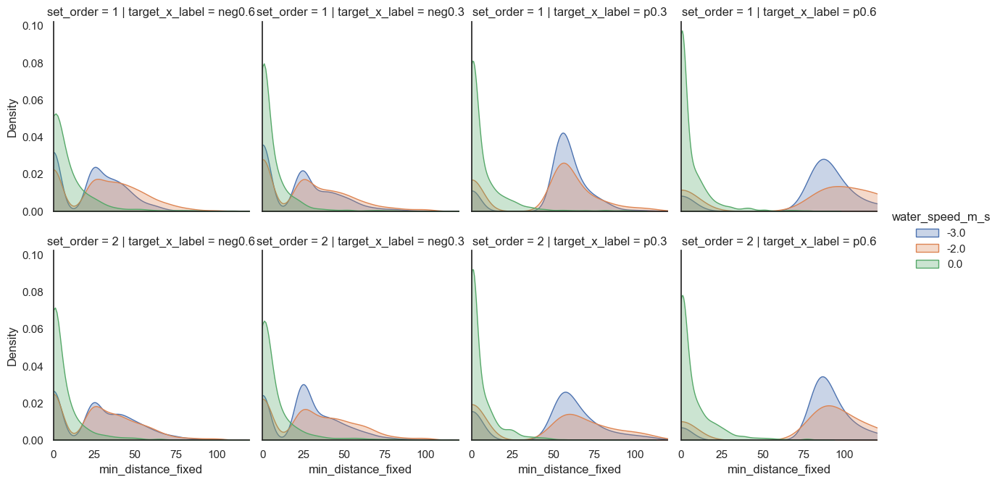

In [18]:
plot_density_targets(df_small_filt, 
                     x_col='min_distance_fixed',
                     x_lim=(0,120),
                    cond_col='water_speed_m_s')

In [ ]:
plot_density_targets(df_small_filt, 
                     x_col='min_x_delta',
                     x_lim=(-110,85),
                    cond_col='water_speed_m_s')

In [31]:
# number of participants
from src.features import N_by_set_order

N_by_set_order(df_small_filt, group_cols=['ppid_full','speed_lable'])

TypeError: unhashable type: 'list'

### BASELINE

In [95]:
from src.features import summarize_phase
baseline = summarize_phase(df_small, phase='baseline', y_col='min_distance_fixed',  ppid_col='ppid_full', lat_error_col='min_x_delta')

baseline_filt = summarize_phase(df_small_filt, phase='baseline',  y_col='min_distance_fixed', ppid_col='ppid_full', lat_error_col = 'min_x_delta')

baseline_filt

,ppid_full,target_x_label,mean_ball_dist_cm,min_ball_dist_cm,mean_ball_dist_x_cm,mean_ball_launch_dev,mean_ball_launch_speed
0,1_neg3,neg0.6,7.103314,0.000001,-1.346350,1.458784,1.677042
1,1_neg3,neg0.3,4.081880,0.000001,0.726062,0.221863,1.564956
2,1_neg3,p0.3,5.215690,0.000001,10.142700,-4.569587,2.082027
3,1_neg3,p0.6,6.480754,0.000001,10.867575,-4.876477,1.986024
4,p000_neg2,neg0.6,6.784088,0.000001,8.573187,-2.577256,1.870402
...,...,...,...,...,...,...,...
327,p050_neg3,p0.6,7.123213,0.000001,1.021775,-1.202697,1.871721
328,p051_neg2,neg0.6,4.024968,0.000001,-7.383750,3.681597,0.969173
329,p051_neg2,neg0.3,7.294925,0.000001,6.835963,-2.345416,0.886972
330,p051_neg2,p0.3,2.409844,0.000001,3.063950,-1.840033,1.044069


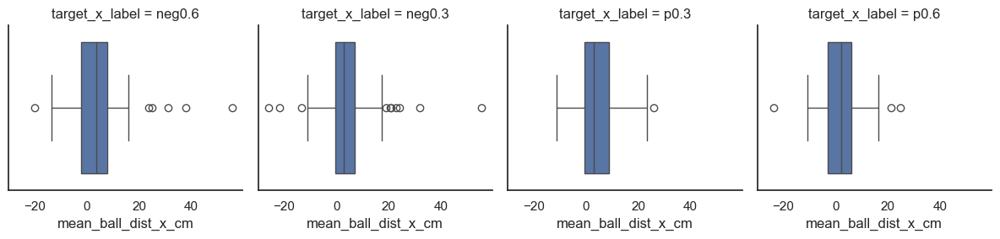

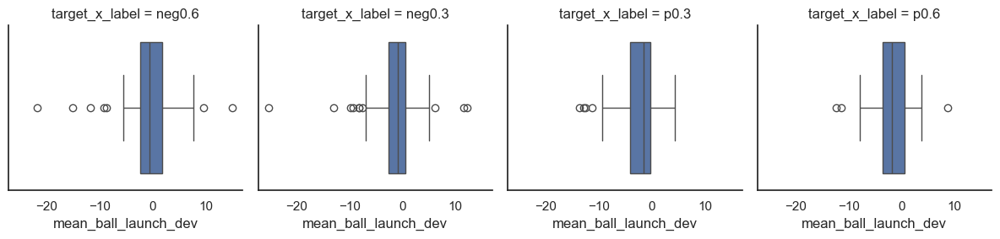

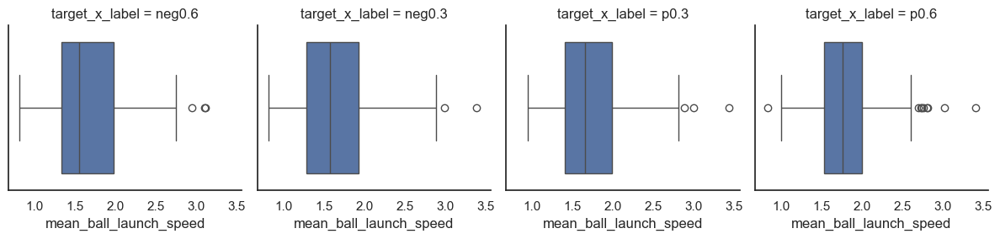

In [20]:
from src.plotting import plot_boxplot_target_error

plot_boxplot_target_error(baseline, measure='mean_ball_dist_x_cm')


plot_boxplot_target_error(baseline, measure='mean_ball_launch_dev')


plot_boxplot_target_error(baseline, measure='mean_ball_launch_speed')



### BASELINE CORRECTED MIN DISTANCE: maybe make a function to loop through cols?

In [96]:
# combine baseline error back to main df
df_BC = df_small.merge(baseline, on=['ppid_full', 'target_x_label'], how='left')

df_filt_BC = df_small_filt.merge(baseline_filt, on=['ppid_full', 'target_x_label'], how='left')


# baseline correct min distance 
df_BC['baseline_corrected_dist'] = df_BC['ball_dist_to_center_cm'] - df_BC['mean_ball_dist_cm']
# baseline corrected error x plane
df_BC['min_x_delta_BC'] = df_BC['min_x_delta'] - df_BC['mean_ball_dist_x_cm']
# baseline corrected launch dev
df_BC['baseline_corrected_dev'] = df_BC['launch_deviation'] - df_BC['mean_ball_launch_dev']
# baseline corrected launch speed
df_BC['baseline_corrected_speed'] = df_BC['launch_Speed'] - df_BC['mean_ball_launch_speed']


# filtered data baseline correct
df_filt_BC['baseline_corrected_dist'] = df_filt_BC['ball_dist_to_center_cm'] - df_filt_BC['mean_ball_dist_cm']
# baseline corrected error x plane
df_filt_BC['min_x_delta_BC'] = df_filt_BC['min_x_delta'] - df_filt_BC['mean_ball_dist_x_cm']
# baseline corrected launch dev
df_filt_BC['baseline_corrected_dev'] = df_filt_BC['launch_deviation'] - df_filt_BC['mean_ball_launch_dev']
# baseline corrected launch speed
df_filt_BC['baseline_corrected_speed'] = df_filt_BC['launch_Speed'] - df_filt_BC['mean_ball_launch_speed']


In [48]:
df_filt_BC

,ppid_full,speed_label,trial_num,phase,trial_num_target,launch_deviation,launch_dev_z,launch_Speed,launch_Speed_z,ball_dist_to_center_cm,...,error_x_plane,mean_ball_dist_cm,min_ball_dist_cm,mean_ball_dist_x_cm,mean_ball_launch_dev,mean_ball_launch_speed,baseline_corrected_dist,min_x_delta_BC,baseline_corrected_dev,baseline_corrected_speed
0,p000_-2.0,-2.0,25,baseline,7,-2.379829,0.955994,1.969417,-0.691633,7.400935,...,2.7510,3.146500,0.000001,3.166157,-1.944168,1.987985,4.254435,0.449843,-0.435661,-0.018568
1,p000_-2.0,-2.0,26,baseline,7,-29.354557,-0.333742,1.142749,-1.893890,72.955993,...,72.4099,14.929390,0.000001,15.795614,-6.468969,1.504982,58.026603,51.320686,-22.885589,-0.362233
2,p000_-2.0,-2.0,27,baseline,7,2.430909,1.186008,1.657019,-1.145966,7.689598,...,-2.9294,7.753244,0.000001,9.393000,-2.971365,1.885979,-0.063646,-13.051600,5.402274,-0.228960
3,p000_-2.0,-2.0,28,baseline,7,-4.166943,0.870547,1.738741,-1.027114,10.719322,...,9.9595,11.001481,0.000001,11.969583,-5.582283,1.754842,-0.282159,-2.010083,1.415340,-0.016101
4,p000_-2.0,-2.0,29,baseline,8,0.802309,1.108141,1.753271,-1.005983,7.250720,...,1.9703,7.753244,0.000001,9.393000,-2.971365,1.885979,-0.502523,-8.157600,3.773674,-0.132708
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
38771,p050_-3.0,-3.0,492,washout_2,122,5.273447,1.331334,4.112829,1.173733,13.375844,...,-13.5430,7.223075,0.000001,4.722057,-2.277764,1.951460,6.152769,-17.754957,7.551211,2.161369
38772,p050_-3.0,-3.0,493,washout_2,123,-1.938383,0.983130,4.617405,1.707477,5.145460,...,2.4980,7.223075,0.000001,4.722057,-2.277764,1.951460,-2.077614,-1.031357,0.339381,2.665945
38773,p050_-3.0,-3.0,494,washout_2,123,-2.213391,0.969851,2.782864,-0.233114,7.337979,...,8.0769,8.277757,1.083997,-4.236029,2.345695,2.312106,-0.939778,11.804429,-4.559086,0.470758
38774,p050_-3.0,-3.0,495,washout_2,124,3.030887,1.223058,3.364877,0.382543,7.570455,...,-8.3097,7.223075,0.000001,4.722057,-2.277764,1.951460,0.347380,-12.474857,5.308651,1.413417


In [ ]:
### FIXED DISTANCE

In [97]:
# combine baseline error back to main df
df_BC = df_small.merge(baseline, on=['ppid_full', 'target_x_label'], how='left')

df_filt_BC = df_small_filt.merge(baseline_filt, on=['ppid_full', 'target_x_label'], how='left')


# baseline correct min distance 
df_BC['min_distance_fixed_BC'] = df_BC['min_distance_fixed'] - df_BC['mean_ball_dist_cm']
# baseline corrected error x plane
df_BC['baseline_corrected_x'] = df_BC['min_x_delta'] - df_BC['mean_ball_dist_x_cm']
# baseline corrected launch dev
df_BC['baseline_corrected_dev'] = df_BC['launch_deviation'] - df_BC['mean_ball_launch_dev']
# baseline corrected launch speed
df_BC['baseline_corrected_speed'] = df_BC['launch_Speed'] - df_BC['mean_ball_launch_speed']


# filtered data baseline correct
df_filt_BC['min_distance_fixed_BC'] = df_filt_BC['min_distance_fixed'] - df_filt_BC['mean_ball_dist_cm']
# baseline corrected error x plane
df_filt_BC['baseline_corrected_x'] = df_filt_BC['min_x_delta'] - df_filt_BC['mean_ball_dist_x_cm']
# baseline corrected launch dev
df_filt_BC['baseline_corrected_dev'] = df_filt_BC['launch_deviation'] - df_filt_BC['mean_ball_launch_dev']
# baseline corrected launch speed
df_filt_BC['baseline_corrected_speed'] = df_filt_BC['launch_Speed'] - df_filt_BC['mean_ball_launch_speed']


In [31]:
baseline_filt

,ppid_full,target_x_label,mean_ball_dist_cm,min_ball_dist_cm,mean_ball_dist_x_cm,mean_ball_launch_dev,mean_ball_launch_speed
0,1_-3.0,neg0.6,7.875678,0.000001,-0.261871,1.127881,1.633495
1,1_-3.0,neg0.3,4.603806,0.000001,-0.475486,0.778439,1.607621
2,1_-3.0,p0.3,3.638294,0.000001,8.289300,-3.802946,2.196611
3,1_-3.0,p0.6,7.060252,0.000001,11.074371,-4.986574,1.977798
4,p000_-2.0,neg0.6,7.753244,0.000001,9.393000,-2.971365,1.885979
...,...,...,...,...,...,...,...
327,p050_-3.0,p0.6,7.663003,0.000001,-0.299071,-0.728174,2.034437
328,p051_-2.0,neg0.6,3.268974,0.000001,-6.260829,3.240752,0.979233
329,p051_-2.0,neg0.3,8.337057,0.000001,8.290671,-2.976653,0.836755
330,p051_-2.0,p0.3,2.754107,0.000001,3.259371,-1.906476,1.043052


In [22]:
# no baseline data
df_no_baseline_BC = df_filt_BC[df_filt_BC['phase'] != 'baseline'].copy()

In [121]:
df_no_baseline_wash_BC = df_filt_BC[~df_filt_BC['phase'].isin(['baseline', 'washout_1', 'washout_2'])].copy()

In [122]:
baseline_filt

,ppid_full,target_x_label,mean_ball_dist_cm,min_ball_dist_cm,mean_ball_dist_x_cm,mean_ball_launch_dev,mean_ball_launch_speed
0,1_neg3,neg0.6,7.103314,0.000001,-1.346350,1.458784,1.677042
1,1_neg3,neg0.3,4.081880,0.000001,0.726062,0.221863,1.564956
2,1_neg3,p0.3,5.215690,0.000001,10.142700,-4.569587,2.082027
3,1_neg3,p0.6,6.480754,0.000001,10.867575,-4.876477,1.986024
4,p000_neg2,neg0.6,6.784088,0.000001,8.573187,-2.577256,1.870402
...,...,...,...,...,...,...,...
327,p050_neg3,p0.6,7.123213,0.000001,1.021775,-1.202697,1.871721
328,p051_neg2,neg0.6,4.024968,0.000001,-7.383750,3.681597,0.969173
329,p051_neg2,neg0.3,7.294925,0.000001,6.835963,-2.345416,0.886972
330,p051_neg2,p0.3,2.409844,0.000001,3.063950,-1.840033,1.044069


In [69]:
df_BC

,ppid,trial_num,phase,trial_num_target,launch_deviation,launch_Speed,ball_dist_to_center_cm,target_hit,water_speed_binary,water_speed_m_s,...,error_x_plane,mean_ball_dist_cm,min_ball_dist_cm,mean_ball_dist_x_cm,mean_ball_launch_dev,mean_ball_launch_speed,baseline_corrected_dist,baseline_corrected_x,baseline_corrected_dev,baseline_corrected_speed
0,1,1,baseline,1,-1.155891,2.877647,6.025467,True,0,0.0,...,6.4524,14.660809,6.025467,2.448338,-0.016983,1.796060,-8.635341,4.004062,-1.138908,1.081587
1,1,2,baseline,1,-9.285237,3.028949,23.203476,False,0,0.0,...,23.1997,13.264166,6.576384,6.081500,-2.013530,1.818056,9.939310,17.118200,-7.271707,1.210893
2,1,3,baseline,1,-5.433519,3.173107,14.747873,False,0,0.0,...,11.8783,14.060765,6.206768,6.935623,-3.445993,2.200281,0.687108,4.942677,-1.987526,0.972826
3,1,4,baseline,1,-7.419443,1.929576,18.619847,False,0,0.0,...,17.1628,11.555948,6.052804,7.137177,-3.462434,2.119316,7.063899,10.025623,-3.957008,-0.189740
4,1,5,baseline,2,-6.313191,2.426742,17.174473,False,0,0.0,...,18.2091,14.660809,6.025467,2.448338,-0.016983,1.796060,2.513664,15.760762,-6.296208,0.630682
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
22315,p050,492,washout_2,122,5.273447,4.112829,13.375844,False,0,0.0,...,-13.5430,29.671025,7.676893,18.272869,-8.702058,1.609071,-16.295181,-31.815869,13.975505,2.503758
22316,p050,493,washout_2,123,-1.938383,4.617405,5.145460,True,0,0.0,...,2.4980,29.671025,7.676893,18.272869,-8.702058,1.609071,-24.525564,-15.774869,6.763675,3.008334
22317,p050,494,washout_2,123,-2.213391,2.782864,7.337979,True,0,0.0,...,8.0769,21.850044,9.833997,7.250223,-2.207187,1.991104,-14.512066,0.826677,-0.006203,0.791760
22318,p050,495,washout_2,124,3.030887,3.364877,7.570455,True,0,0.0,...,-8.3097,29.671025,7.676893,18.272869,-8.702058,1.609071,-22.100570,-26.582569,11.732945,1.755806


In [32]:
df_filt_BC

,ppid_full,speed_label,trial_num,phase,trial_num_target,launch_deviation,launch_dev_z,launch_Speed,launch_Speed_z,ball_dist_to_center_cm,...,error_x_plane,mean_ball_dist_cm,min_ball_dist_cm,mean_ball_dist_x_cm,mean_ball_launch_dev,mean_ball_launch_speed,min_distance_fixed_BC,baseline_corrected_x,baseline_corrected_dev,baseline_corrected_speed
0,p000_-2.0,-2.0,25,baseline,7,-2.379829,0.955994,1.969417,-0.691633,7.400935,...,2.7510,3.146500,0.000001,3.166157,-1.944168,1.987985,-3.146499,0.449843,-0.435661,-0.018568
1,p000_-2.0,-2.0,26,baseline,7,-29.354557,-0.333742,1.142749,-1.893890,72.955993,...,72.4099,14.929390,0.000001,15.795614,-6.468969,1.504982,49.276603,51.320686,-22.885589,-0.362233
2,p000_-2.0,-2.0,27,baseline,7,2.430909,1.186008,1.657019,-1.145966,7.689598,...,-2.9294,7.753244,0.000001,9.393000,-2.971365,1.885979,-7.753243,-13.051600,5.402274,-0.228960
3,p000_-2.0,-2.0,28,baseline,7,-4.166943,0.870547,1.738741,-1.027114,10.719322,...,9.9595,11.001481,0.000001,11.969583,-5.582283,1.754842,-9.032159,-2.010083,1.415340,-0.016101
4,p000_-2.0,-2.0,29,baseline,8,0.802309,1.108141,1.753271,-1.005983,7.250720,...,1.9703,7.753244,0.000001,9.393000,-2.971365,1.885979,-7.753243,-8.157600,3.773674,-0.132708
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
38771,p050_-3.0,-3.0,492,washout_2,122,5.273447,1.331334,4.112829,1.173733,13.375844,...,-13.5430,7.223075,0.000001,4.722057,-2.277764,1.951460,-2.597231,-17.754957,7.551211,2.161369
38772,p050_-3.0,-3.0,493,washout_2,123,-1.938383,0.983130,4.617405,1.707477,5.145460,...,2.4980,7.223075,0.000001,4.722057,-2.277764,1.951460,-7.223074,-1.031357,0.339381,2.665945
38773,p050_-3.0,-3.0,494,washout_2,123,-2.213391,0.969851,2.782864,-0.233114,7.337979,...,8.0769,8.277757,1.083997,-4.236029,2.345695,2.312106,-8.277756,11.804429,-4.559086,0.470758
38774,p050_-3.0,-3.0,495,washout_2,124,3.030887,1.223058,3.364877,0.382543,7.570455,...,-8.3097,7.223075,0.000001,4.722057,-2.277764,1.951460,-7.223074,-12.474857,5.308651,1.413417


In [28]:
df_filt_BC['trial_num'].min()

25

In [123]:
# baseline only:

df_baseline_BC = df_filt_BC[df_filt_BC['phase'] == 'baseline'].copy()

In [124]:
df_baseline_BC


,ppid_full,speed_label,trial_num,phase,trial_num_target,launch_deviation,launch_dev_z,launch_Speed,launch_Speed_z,ball_dist_to_center_cm,...,error_x_plane,mean_ball_dist_cm,min_ball_dist_cm,mean_ball_dist_x_cm,mean_ball_launch_dev,mean_ball_launch_speed,min_distance_fixed_BC,baseline_corrected_x,baseline_corrected_dev,baseline_corrected_speed
0,p000_neg2,-2.0,21,baseline,6,0.980091,1.116641,1.442353,-1.458163,7.727737,...,-6.0046,2.753188,0.000001,2.090063,-1.578636,1.919781,-2.753187,-7.532662,2.558726,-0.477428
1,p000_neg2,-2.0,22,baseline,6,-6.044347,0.780783,1.175063,-1.846894,15.094659,...,15.2645,13.856298,0.000001,15.713037,-6.415891,1.463742,-7.511640,-0.578038,0.371544,-0.288679
2,p000_neg2,-2.0,23,baseline,6,-2.092893,0.969713,1.804944,-0.930832,7.815149,...,2.9370,9.429841,0.000001,10.746857,-5.083799,1.762000,-9.429840,-7.336357,2.990906,0.042944
3,p000_neg2,-2.0,24,baseline,6,0.181509,1.078458,1.761366,-0.994210,7.371344,...,3.5561,6.784088,0.000001,8.573187,-2.577256,1.870402,-6.784087,-5.738688,2.758765,-0.109036
4,p000_neg2,-2.0,25,baseline,7,-2.379829,0.955994,1.969417,-0.691633,7.400935,...,2.7510,2.753188,0.000001,2.090063,-1.578636,1.919781,-2.753187,1.525937,-0.801194,0.049636
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
38665,p050_neg3,-3.0,48,baseline,12,3.212637,1.231833,2.439903,-0.595901,8.027505,...,-8.4792,7.109586,0.000001,2.243862,-1.238110,1.867948,-7.109585,-10.329562,4.450748,0.571955
38666,p050_neg3,-3.0,49,baseline,13,2.335301,1.189473,3.459639,0.482783,6.807774,...,-8.0416,7.123213,0.000001,1.021775,-1.202697,1.871721,-7.123212,-8.437975,3.537997,1.587918
38667,p050_neg3,-3.0,50,baseline,13,5.437243,1.339243,3.083719,0.085132,14.261895,...,-12.8321,11.476971,0.000001,7.661700,-2.929526,2.209471,-5.965076,-20.493800,8.366769,0.874248
38668,p050_neg3,-3.0,51,baseline,13,4.360927,1.287276,2.914263,-0.094120,11.225601,...,-11.0271,7.109586,0.000001,2.243862,-1.238110,1.867948,-4.633985,-12.864762,5.599038,1.046315


C:\Users\jacob\anaconda3\envs\water_current_project\lib\site-packages\seaborn\relational.py:313: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  for _, unit_data in sub_data.groupby("units"):
C:\Users\jacob\anaconda3\envs\water_current_project\lib\site-packages\seaborn\relational.py:313: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  for _, unit_data in sub_data.groupby("units"):
C:\Users\jacob\anaconda3\envs\water_current_project\lib\site-packages\seaborn\relational.py:313: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False t

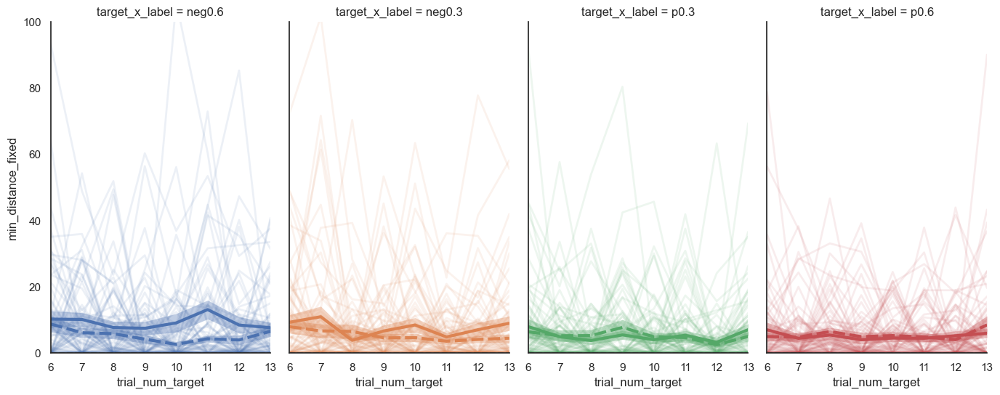

In [126]:
# baseline error plot: 8.75 is likely min
from src.plotting import plot_baseline

plot_baseline(df_baseline_BC, context='notebook', font_scale=3, y_col='min_distance_fixed', ppid_col='ppid_full', cond_col='speed_label', y_lim=(0,100))

#plot_baseline(df_small, y_col='launch_deviation', y_lim=(-30,30))

#plot_baseline(df_small, y_col='launch_Speed', y_lim=(0.0,4.0))

In [59]:
df_filt_BC.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 38776 entries, 0 to 38775
Data columns (total 36 columns):
 #   Column                              Non-Null Count  Dtype   
---  ------                              --------------  -----   
 0   ppid_full                           38776 non-null  category
 1   speed_label                         38776 non-null  category
 2   trial_num                           38776 non-null  int32   
 3   phase                               38776 non-null  category
 4   trial_num_target                    38776 non-null  int32   
 5   launch_deviation                    38776 non-null  float64 
 6   launch_dev_z                        38776 non-null  float64 
 7   launch_Speed                        38776 non-null  float64 
 8   launch_Speed_z                      38776 non-null  float64 
 9   ball_dist_to_center_cm              38776 non-null  float64 
 10  min_x_delta                         38776 non-null  float64 
 11  target_hit                  

In [327]:
df_filt_BC['trial_num'].min()

25

C:\Users\jacob\anaconda3\envs\water_current_project\lib\site-packages\seaborn\relational.py:313: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  for _, unit_data in sub_data.groupby("units"):
C:\Users\jacob\anaconda3\envs\water_current_project\lib\site-packages\seaborn\relational.py:313: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  for _, unit_data in sub_data.groupby("units"):
C:\Users\jacob\anaconda3\envs\water_current_project\lib\site-packages\seaborn\relational.py:313: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False t

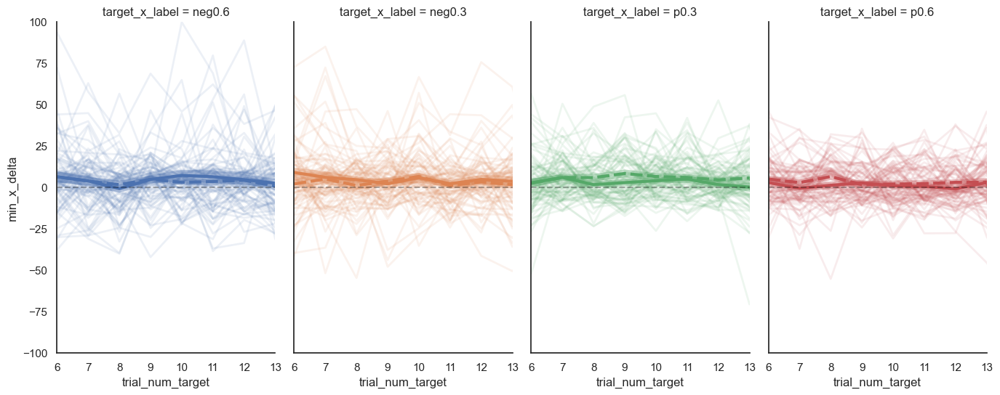

In [127]:
from src.plotting import plot_baseline

plot_baseline(df_filt_BC, 
              context='notebook', 
              font_scale=3, 
              x_col='trial_num_target',
              y_col='min_x_delta', 
              ppid_col='ppid_full', 
              cond_col='speed_label', 
              y_lim=(-100,100)
              )

C:\Users\jacob\anaconda3\envs\water_current_project\lib\site-packages\seaborn\relational.py:313: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  for _, unit_data in sub_data.groupby("units"):
C:\Users\jacob\anaconda3\envs\water_current_project\lib\site-packages\seaborn\relational.py:313: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  for _, unit_data in sub_data.groupby("units"):
C:\Users\jacob\anaconda3\envs\water_current_project\lib\site-packages\seaborn\relational.py:313: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False t

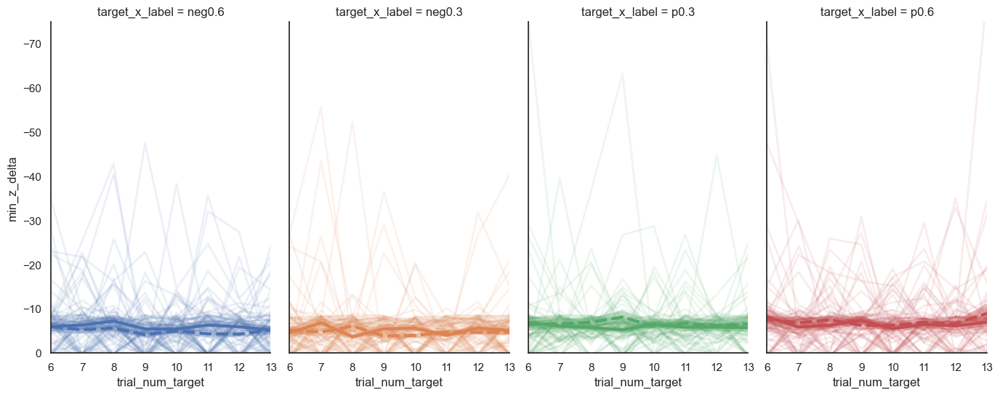

In [101]:
from src.plotting import plot_baseline

plot_baseline(df_filt_BC, 
              context='notebook', 
              font_scale=3, 
              x_col='trial_num_target',
              y_col='min_z_delta', 
              ppid_col='ppid_full', 
              cond_col='speed_label', 
              y_lim=(0,-75)
              )

### TRAINING - Early to Late: Update function to allow accepting a list of variables to agg?

In [87]:
df_filt_BC.columns

Index(['ppid_full', 'speed_label', 'trial_num', 'phase', 'trial_num_target',
       'launch_deviation', 'launch_dev_z', 'launch_Speed', 'launch_Speed_z',
       'ball_dist_to_center_cm', 'min_x_delta', 'target_hit',
       'water_speed_binary', 'water_speed_m_s', 'target_x_label', 'sign_label',
       'set_order', 'ball_pos_x', 'ball_pos_z', 'min_pos_from_target_x',
       'min_pos_from_target_z', 'target_position_x', 'target_position_z',
       'target_angle_90', 'ball_dist_to_center_cm_radii_fixed',
       'min_distance_fixed', 'error_x_plane', 'mean_ball_dist_cm',
       'min_ball_dist_cm', 'mean_ball_dist_x_cm', 'mean_ball_launch_dev',
       'mean_ball_launch_speed', 'min_distance_fixed_BC',
       'baseline_corrected_x', 'baseline_corrected_dev',
       'baseline_corrected_speed'],
      dtype='object')

In [55]:
from src.early_late_exposure import early_late_means

early_late_4_means = early_late_means(
                                            df_filt_BC,
                                            error_col='baseline_corrected_x', #baseline_corrected_dist
                                            window_size=4,
                                            ppid='ppid_full'
                                            )
early_late_4_means

C:\Users\jacob\water_current_MA\src\early_late_exposure.py:31: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  .groupby([ppid,'phase','speed_label','target_x_label'])
C:\Users\jacob\water_current_MA\src\early_late_exposure.py:39: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  ordered = (df_phase
C:\Users\jacob\water_current_MA\src\early_late_exposure.py:56: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  early_to_late.groupby

,ppid_full,section,target_x_label,set_order,phase,speed_label,mean_x_delta_cm,var_x_delta_cm,n
0,1_neg3,early,neg0.6,1,training_1,-3.0,-3.158250,261.007766,4
1,1_neg3,early,neg0.3,1,training_2,-3.0,9.325962,205.215118,4
2,1_neg3,early,p0.3,1,training_1,-3.0,-30.785925,106.564380,4
3,1_neg3,early,p0.6,1,training_2,-3.0,-29.365800,24.290918,4
4,1_neg3,late,neg0.6,1,training_1,-3.0,8.581925,6.519799,4
...,...,...,...,...,...,...,...,...,...
659,p051_neg2,early,p0.6,2,training_1,-2.0,-10.512175,1.911751,4
660,p051_neg2,late,neg0.6,2,training_2,-2.0,11.833575,5.572976,4
661,p051_neg2,late,neg0.3,2,training_1,-2.0,-5.679488,108.296164,4
662,p051_neg2,late,p0.3,2,training_2,-2.0,2.028250,4.264832,4


C:\Users\jacob\water_current_MA\src\early_late_exposure.py:31: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  .groupby([ppid,'phase','speed_label','target_x_label'])
C:\Users\jacob\water_current_MA\src\early_late_exposure.py:39: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  ordered = (df_phase
C:\Users\jacob\water_current_MA\src\early_late_exposure.py:56: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  early_to_late.groupby

KeyError: "Column(s) ['var_x_delta_cm'] do not exist"

In [56]:
early_late_4_means.to_csv(
    r"C:\Users\jacob\water_current_MA\data\early_late_training.csv",
    index=False
)

C:\Users\jacob\anaconda3\envs\water_current_project\lib\site-packages\seaborn\axisgrid.py:854: UserWarning: The palette list has more values (10) than needed (2), which may not be intended.
  func(*plot_args, **plot_kwargs)
C:\Users\jacob\anaconda3\envs\water_current_project\lib\site-packages\seaborn\axisgrid.py:854: UserWarning: The palette list has more values (10) than needed (2), which may not be intended.
  func(*plot_args, **plot_kwargs)
C:\Users\jacob\anaconda3\envs\water_current_project\lib\site-packages\seaborn\axisgrid.py:854: UserWarning: The palette list has more values (10) than needed (2), which may not be intended.
  func(*plot_args, **plot_kwargs)
C:\Users\jacob\anaconda3\envs\water_current_project\lib\site-packages\seaborn\axisgrid.py:854: UserWarning: The palette list has more values (10) than needed (2), which may not be intended.
  func(*plot_args, **plot_kwargs)
C:\Users\jacob\anaconda3\envs\water_current_project\lib\site-packages\seaborn\axisgrid.py:854: UserWarni

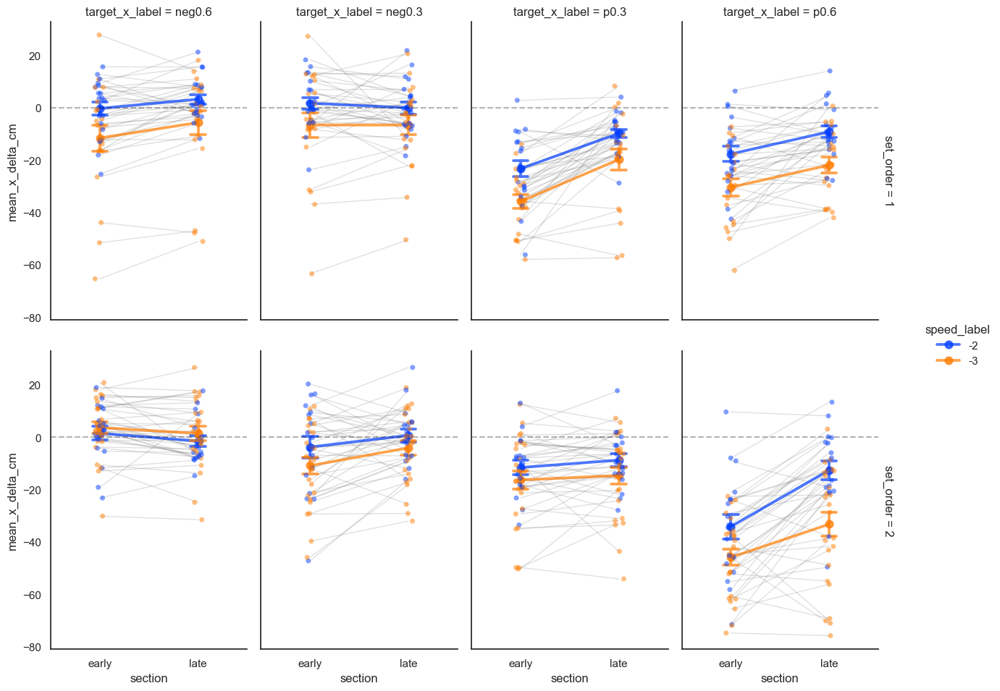

In [59]:
from src.plotting import plot_early_late_exposure

#early_late_4_means['training_status'].unique()


plot_early_late_exposure(early_late_4_means,
                         cond_col='speed_label', 
                         ppid_col='ppid_full',
                         show_zero_line=True)
#plot_early_late_exposure(early_late_10_means_dev)
#plot_early_late_exposure(early_late_10_means_speed)

C:\Users\jacob\anaconda3\envs\water_current_project\lib\site-packages\seaborn\axisgrid.py:854: UserWarning: The palette list has more values (10) than needed (2), which may not be intended.
  func(*plot_args, **plot_kwargs)
C:\Users\jacob\anaconda3\envs\water_current_project\lib\site-packages\seaborn\axisgrid.py:854: UserWarning: The palette list has more values (10) than needed (2), which may not be intended.
  func(*plot_args, **plot_kwargs)
C:\Users\jacob\anaconda3\envs\water_current_project\lib\site-packages\seaborn\axisgrid.py:854: UserWarning: The palette list has more values (10) than needed (2), which may not be intended.
  func(*plot_args, **plot_kwargs)
C:\Users\jacob\anaconda3\envs\water_current_project\lib\site-packages\seaborn\axisgrid.py:854: UserWarning: The palette list has more values (10) than needed (2), which may not be intended.
  func(*plot_args, **plot_kwargs)
C:\Users\jacob\anaconda3\envs\water_current_project\lib\site-packages\seaborn\axisgrid.py:854: UserWarni

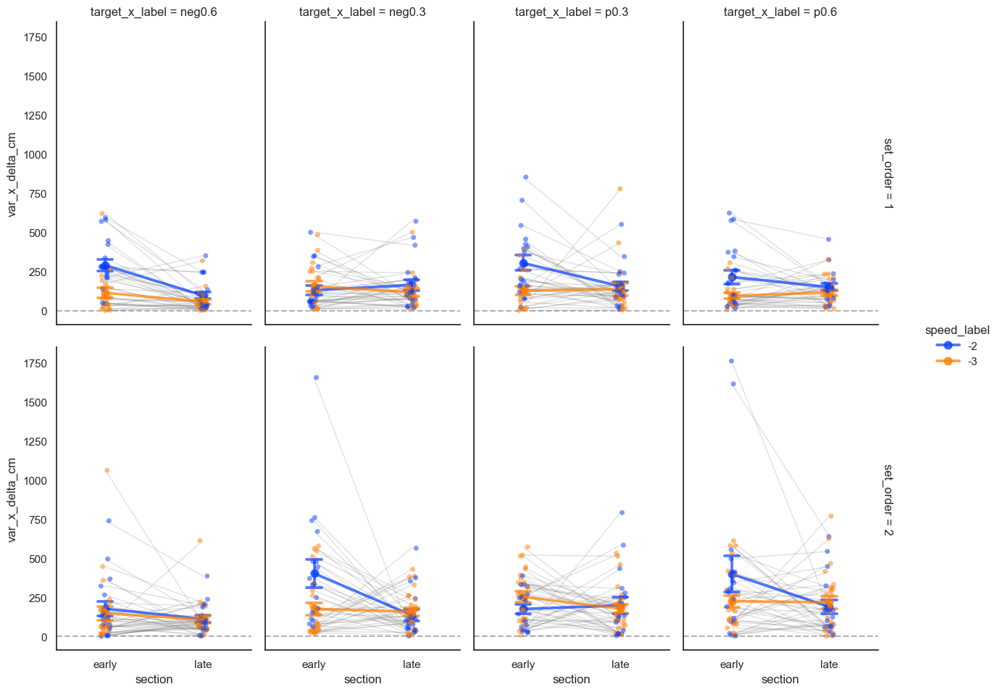

In [104]:
from src.plotting import plot_early_late_exposure

#early_late_4_means['training_status'].unique()


plot_early_late_exposure(early_late_4_means,
                         y_col='var_x_delta_cm',
                         cond_col='speed_label', 
                         ppid_col='ppid_full',
                         show_zero_line=True)
#plot_early_late_exposure(early_late_10_means_dev)
#plot_early_late_exposure(early_late_10_means_speed)

### ALL EXPOSURE TRIALS

In [68]:
from src.filter_phase import filter_for_phase

training = filter_for_phase(df_filt_BC, phase_key='t', inc_phase=True, expected_n=75, ppid_col='ppid_full')
training_df = training[0]
training_df['trial_num'].min()

C:\Users\jacob\water_current_MA\src\filter_phase.py:23: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  selected_phase['phase_trial_target'] = selected_phase.groupby([ppid_col, 'phase','target_x_label']).cumcount() + 1
C:\Users\jacob\water_current_MA\src\filter_phase.py:32: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  max_check = selected_phase.groupby([ppid_col,'target_x_label'])['phase_trial_target'].max()


53

In [335]:
df_filt_BC['phase']

0         baseline
1         baseline
2         baseline
3         baseline
4         baseline
           ...    
20933    washout_2
20934    washout_2
20935    washout_2
20936    washout_2
20937    washout_2
Name: phase, Length: 20938, dtype: category
Categories (5, object): ['baseline', 'training_1', 'training_2', 'washout_1', 'washout_2']

# Solution-space heatmap & GAMs

In [228]:
target_labels = np.unique(training_df['target_x_label'])


speeds = np.array(training_df['launch_Speed']) #.reshape(-1,1)
angles = np.array(training_df['launch_deviation'])#.reshape(-1,1)
error = np.array(training_df['baseline_corrected_dist'])#.reshape(-1,1)
targets = np.array(training_df['target_x_label'])#.reshape(-1,1)


for label in target_labels:

    mask = (targets == label)

    errors_masked = error[mask].ravel()

    # launch speeds per target mask
    speeds_masked = speeds[mask].ravel()
         
    # launch deviations per target mask
    angles_masked = angles[mask].ravel()

    plt.figure()
    
    cmap = sns.color_palette("Spectral", as_cmap=True)
    sns.scatterplot(x=angles_masked, y=speeds_masked, hue=errors_masked, palette=cmap)

    plt.xlim(-100,30)

    plt.title(label)
    plt.show()
    

KeyError: 'baseline_corrected_dist'

In [755]:
target_labels = np.unique(training_df['target_x_label'])


speeds_z = np.array(training_df['launch_Speed_z']) #.reshape(-1,1)
angles_z = np.array(training_df['launch_dev_z'])#.reshape(-1,1)
error_bc = np.array(training_df['baseline_corrected_dist'])#.reshape(-1,1)
error = np.array(training_df['ball_dist_to_center_cm'])#.reshape(-1,1)
lat_error = np.array(training_df['error_x_plane'])#.reshape(-1,1)

targets = np.array(training_df['target_x_label'])#.reshape(-1,1)


for label in target_labels:

    mask = (targets == label)

    errors_masked = error[mask].ravel()


    # launch speeds per target mask
    speeds_masked = speeds_z[mask].ravel()
    # min
    min_speeds_mask = np.min(speeds_masked)
    # max
    max_speeds_mask = np.max(speeds_masked)
    # range
    range_speeds_mask = max_speeds_mask - min_speeds_mask
    
    # sampled launch speed deviations
    speed_edges = (np.linspace(
                    min_speeds_mask,
                    max_speeds_mask,
                    num=101 # 100 bins
                    )
         )

    print('speed edges:', speed_edges)

    speed_bins = np.digitize(speeds_masked, speed_edges) - 1

         

    # launch deviations per target mask
    angles_masked = angles_z[mask].ravel()
    # min
    min_angles_mask = np.min(angles_masked)
    # max
    max_angles_mask = np.max(angles_masked)
    # range
    range_angles_mask = max_angles_mask - min_angles_mask

    # sampled launch angle deviations
    angle_edges = (np.linspace(
                    min_angles_mask,
                    max_angles_mask,
                    num=101 # 100 bins
                    )
         )
    print('angle edges:', angle_edges)

    angle_bins = np.digitize(angles_masked, angle_edges) - 1
    

    #plt.figure()

    #sns.scatterplot(x=angles_masked, y=speeds_masked, hue=errors_masked)

    #plt.xlim(-100,30)

    #plt.title(label)
    #plt.show()
    

speed edges: [-1.95035869 -1.88335208 -1.81634547 -1.74933886 -1.68233225 -1.61532563
 -1.54831902 -1.48131241 -1.4143058  -1.34729919 -1.28029258 -1.21328597
 -1.14627936 -1.07927275 -1.01226614 -0.94525953 -0.87825291 -0.8112463
 -0.74423969 -0.67723308 -0.61022647 -0.54321986 -0.47621325 -0.40920664
 -0.34220003 -0.27519342 -0.20818681 -0.1411802  -0.07417358 -0.00716697
  0.05983964  0.12684625  0.19385286  0.26085947  0.32786608  0.39487269
  0.4618793   0.52888591  0.59589252  0.66289914  0.72990575  0.79691236
  0.86391897  0.93092558  0.99793219  1.0649388   1.13194541  1.19895202
  1.26595863  1.33296524  1.39997185  1.46697847  1.53398508  1.60099169
  1.6679983   1.73500491  1.80201152  1.86901813  1.93602474  2.00303135
  2.07003796  2.13704457  2.20405119  2.2710578   2.33806441  2.40507102
  2.47207763  2.53908424  2.60609085  2.67309746  2.74010407  2.80711068
  2.87411729  2.9411239   3.00813052  3.07513713  3.14214374  3.20915035
  3.27615696  3.34316357  3.41017018  3

In [667]:
import pygam
import scipy
import progressbar

In [757]:
# ensure angles, speed, and error are flaots
angles_z = np.asarray(angles_z, dtype=float)
speeds_z = np.asarray(speeds_z, dtype=float)
trial_n_z = np.asarray(
error = np.asarray(error, dtype=float)
lat_error = np.asarray(lat_error, dtype=float)
intercept = np.ones(len(error))

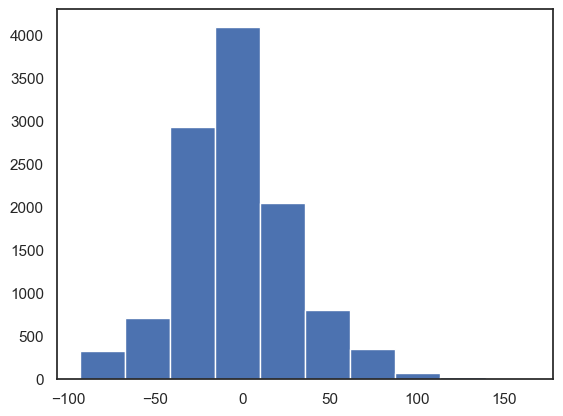

((array([-3.84125604, -3.61779754, -3.49519506, ...,  3.49519506,
          3.61779754,  3.84125604], shape=(11325,)),
  array([-93.2212, -93.1513, -93.1228, ..., 141.2169, 157.4061, 165.119 ],
        shape=(11325,))),
 (np.float64(33.06985351400181),
  np.float64(-2.5598339602649065),
  np.float64(0.9908670097152065)))

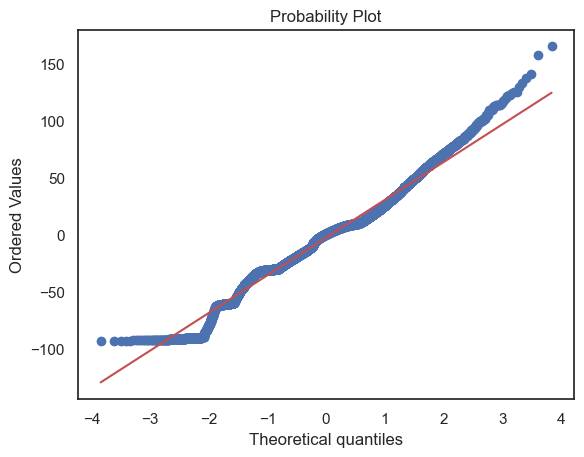

In [707]:
import scipy.stats as stats

plt.hist(lat_error)
plt.show()


In [709]:
stats.shapiro(lat_error[:5000]) 

ShapiroResult(statistic=np.float64(0.9818867966261505), pvalue=np.float64(8.424234994220266e-25))

In [785]:
tgts = pd.get_dummies(training_df['target_x_label'], prefix='tgt', drop_first=True)


In [793]:
# construct design matrix
X = np.column_stack([angles_z, speeds_z, tgts])
print(X.shape)

Y = lat_error # error
print(Y.shape)

Y_z = (lat_error - lat_error.mean()) / lat_error.std(ddof=0)

(11325, 5)
(11325,)


In [190]:
training_df.groupby(['target_x_label', 'ppid_full'])[['phase_trial_target','trial_num']].max()

C:\Users\jacob\AppData\Local\Temp\ipykernel_15812\2438260199.py:1: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  training_df.groupby(['target_x_label', 'ppid_full'])[['phase_trial_target','trial_num']].max()


phase_trial_target  trial_num
target_x_label ppid_full                               
neg0.6         1_neg3                     74        201
               p000_neg2                  73        202
               p002_neg3                  74        423
               p003_neg2                  74        201
               p003_neg3                  73        202
...                                      ...        ...
p0.6           p049_neg2                  75        202
               p049_neg3                  75        202
               p050_neg2                  75        202
               p050_neg3                  72        201
               p051_neg2                  75        202

[332 rows x 2 columns]

In [230]:
print(training_df['phase_trial_target'].max())

print(
    training_df.groupby(['target_x_label'])['phase_trial_target']
        .max()
)

print(
    training_df.groupby(['target_x_label', 'phase'])['phase_trial_target']
        .max()
)


75
target_x_label
neg0.3    75
neg0.6    75
p0.3      75
p0.6      75
Name: phase_trial_target, dtype: int64
target_x_label  phase     
neg0.3          baseline       NaN
                training_1    75.0
                training_2    75.0
                washout_1      NaN
                washout_2      NaN
neg0.6          baseline       NaN
                training_1    75.0
                training_2    75.0
                washout_1      NaN
                washout_2      NaN
p0.3            baseline       NaN
                training_1    75.0
                training_2    75.0
                washout_1      NaN
                washout_2      NaN
p0.6            baseline       NaN
                training_1    75.0
                training_2    75.0
                washout_1      NaN
                washout_2      NaN
Name: phase_trial_target, dtype: float64


C:\Users\jacob\AppData\Local\Temp\ipykernel_30428\171956076.py:4: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  training_df.groupby(['target_x_label'])['phase_trial_target']
C:\Users\jacob\AppData\Local\Temp\ipykernel_30428\171956076.py:9: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  training_df.groupby(['target_x_label', 'phase'])['phase_trial_target']


In [80]:
df_filt_BC['min_

,ppid_full,speed_label,trial_num,phase,trial_num_target,launch_deviation,launch_dev_z,launch_Speed,launch_Speed_z,ball_dist_to_center_cm,...,log_min_distance_fixed,mean_ball_dist_cm,min_ball_dist_cm,mean_ball_dist_x_cm,mean_ball_launch_dev,mean_ball_launch_speed,min_distance_fixed_BC,baseline_corrected_x,baseline_corrected_dev,baseline_corrected_speed
0,p000_-2.0,-2.0,25,baseline,7,-2.379829,0.955994,1.969417,-0.691633,7.400935,...,-13.815511,3.146500,0.000001,2.874871,-1.944168,1.987985,-3.146499,-0.123871,-0.435661,-0.018568
1,p000_-2.0,-2.0,26,baseline,7,-29.354557,-0.333742,1.142749,-1.893890,72.955993,...,4.162097,14.929390,0.000001,16.687057,-6.468969,1.504982,49.276603,55.722843,-22.885589,-0.362233
2,p000_-2.0,-2.0,27,baseline,7,2.430909,1.186008,1.657019,-1.145966,7.689598,...,-13.815511,7.753244,0.000001,9.813686,-2.971365,1.885979,-7.753243,-12.743086,5.402274,-0.228960
3,p000_-2.0,-2.0,28,baseline,7,-4.166943,0.870547,1.738741,-1.027114,10.719322,...,0.677689,11.001481,0.000001,12.630350,-5.582283,1.754842,-9.032159,-2.670850,1.415340,-0.016101
4,p000_-2.0,-2.0,29,baseline,8,0.802309,1.108141,1.753271,-1.005983,7.250720,...,-13.815511,7.753244,0.000001,9.813686,-2.971365,1.885979,-7.753243,-7.843386,3.773674,-0.132708
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
38771,p050_-3.0,-3.0,492,washout_2,122,5.273447,1.331334,4.112829,1.173733,13.375844,...,1.531659,7.223075,0.000001,4.822300,-2.277764,1.951460,-2.597231,-18.365300,7.551211,2.161369
38772,p050_-3.0,-3.0,493,washout_2,123,-1.938383,0.983130,4.617405,1.707477,5.145460,...,-13.815511,7.223075,0.000001,4.822300,-2.277764,1.951460,-7.223074,-2.324300,0.339381,2.665945
38773,p050_-3.0,-3.0,494,washout_2,123,-2.213391,0.969851,2.782864,-0.233114,7.337979,...,-13.815511,8.277757,1.083997,-4.416843,2.345695,2.312106,-8.277756,12.493743,-4.559086,0.470758
38774,p050_-3.0,-3.0,495,washout_2,124,3.030887,1.223058,3.364877,0.382543,7.570455,...,-13.815511,7.223075,0.000001,4.822300,-2.277764,1.951460,-7.223074,-13.132000,5.308651,1.413417


In [129]:
df_filt_BC['target_x_label']

order_targets(data=df_filt_BC)

0          p0.6
1        neg0.3
2        neg0.6
3          p0.3
4        neg0.6
          ...  
38771      p0.3
38772      p0.3
38773    neg0.6
38774      p0.3
38775    neg0.6
Name: target_x_label, Length: 38776, dtype: category
Categories (4, object): ['neg0.6' < 'neg0.3' < 'p0.3' < 'p0.6']


,ppid_full,speed_label,trial_num,phase,trial_num_target,launch_deviation,launch_dev_z,launch_Speed,launch_Speed_z,ball_dist_to_center_cm,...,error_x_plane,mean_ball_dist_cm,min_ball_dist_cm,mean_ball_dist_x_cm,mean_ball_launch_dev,mean_ball_launch_speed,min_distance_fixed_BC,baseline_corrected_x,baseline_corrected_dev,baseline_corrected_speed
0,p000_-2.0,-2.0,25,baseline,7,-2.379829,0.955994,1.969417,-0.691633,7.400935,...,2.7510,3.146500,0.000001,2.874871,-1.944168,1.987985,-3.146499,-0.123871,-0.435661,-0.018568
1,p000_-2.0,-2.0,26,baseline,7,-29.354557,-0.333742,1.142749,-1.893890,72.955993,...,72.4099,14.929390,0.000001,16.687057,-6.468969,1.504982,49.276603,55.722843,-22.885589,-0.362233
2,p000_-2.0,-2.0,27,baseline,7,2.430909,1.186008,1.657019,-1.145966,7.689598,...,-2.9294,7.753244,0.000001,9.813686,-2.971365,1.885979,-7.753243,-12.743086,5.402274,-0.228960
3,p000_-2.0,-2.0,28,baseline,7,-4.166943,0.870547,1.738741,-1.027114,10.719322,...,9.9595,11.001481,0.000001,12.630350,-5.582283,1.754842,-9.032159,-2.670850,1.415340,-0.016101
4,p000_-2.0,-2.0,29,baseline,8,0.802309,1.108141,1.753271,-1.005983,7.250720,...,1.9703,7.753244,0.000001,9.813686,-2.971365,1.885979,-7.753243,-7.843386,3.773674,-0.132708
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
38771,p050_-3.0,-3.0,492,washout_2,122,5.273447,1.331334,4.112829,1.173733,13.375844,...,-13.5430,7.223075,0.000001,4.822300,-2.277764,1.951460,-2.597231,-18.365300,7.551211,2.161369
38772,p050_-3.0,-3.0,493,washout_2,123,-1.938383,0.983130,4.617405,1.707477,5.145460,...,2.4980,7.223075,0.000001,4.822300,-2.277764,1.951460,-7.223074,-2.324300,0.339381,2.665945
38773,p050_-3.0,-3.0,494,washout_2,123,-2.213391,0.969851,2.782864,-0.233114,7.337979,...,8.0769,8.277757,1.083997,-4.416843,2.345695,2.312106,-8.277756,12.493743,-4.559086,0.470758
38774,p050_-3.0,-3.0,495,washout_2,124,3.030887,1.223058,3.364877,0.382543,7.570455,...,-8.3097,7.223075,0.000001,4.822300,-2.277764,1.951460,-7.223074,-13.132000,5.308651,1.413417


C:\Users\jacob\anaconda3\envs\water_current_project\lib\site-packages\seaborn\relational.py:313: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  for _, unit_data in sub_data.groupby("units"):
C:\Users\jacob\anaconda3\envs\water_current_project\lib\site-packages\seaborn\relational.py:313: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  for _, unit_data in sub_data.groupby("units"):
C:\Users\jacob\anaconda3\envs\water_current_project\lib\site-packages\seaborn\relational.py:313: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False t

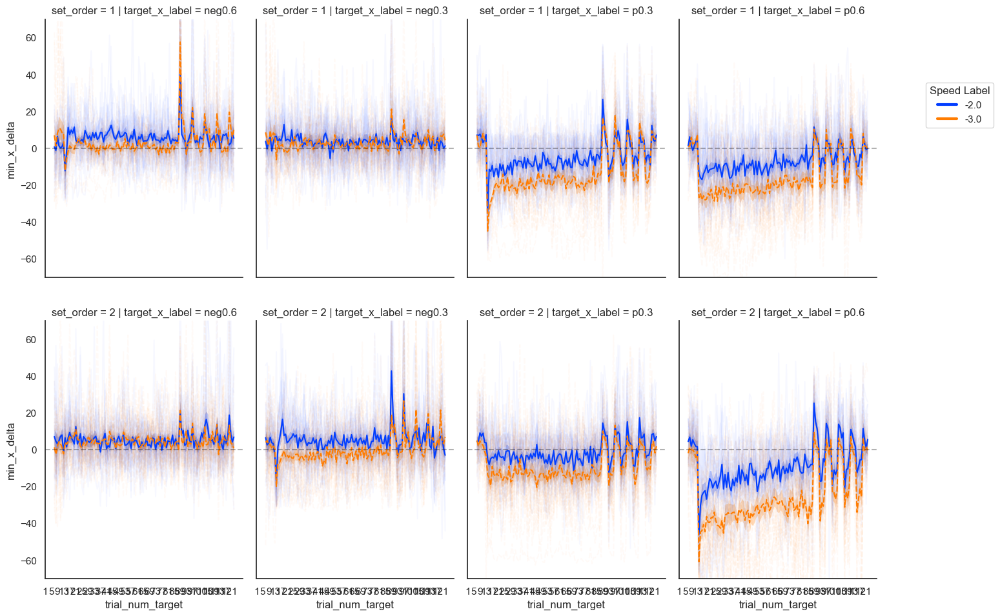

In [63]:
from src.plotting import plot_exposure_trials


plot_exposure_trials(df_filt_BC, 
                     cond_col='speed_label',
                     ppid_col='ppid_full',
                     y_col = 'min_x_delta', 
                     x_col='trial_num_target',
                     context='poster', 
                     font_scale=3,
                     marker_size=0,
                     estimator='mean',
                     y_lim=(-70,70),
                     show_zero_line=True
                    )

C:\Users\jacob\anaconda3\envs\water_current_project\lib\site-packages\seaborn\relational.py:313: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  for _, unit_data in sub_data.groupby("units"):
C:\Users\jacob\anaconda3\envs\water_current_project\lib\site-packages\seaborn\relational.py:313: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  for _, unit_data in sub_data.groupby("units"):
C:\Users\jacob\anaconda3\envs\water_current_project\lib\site-packages\seaborn\relational.py:313: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False t

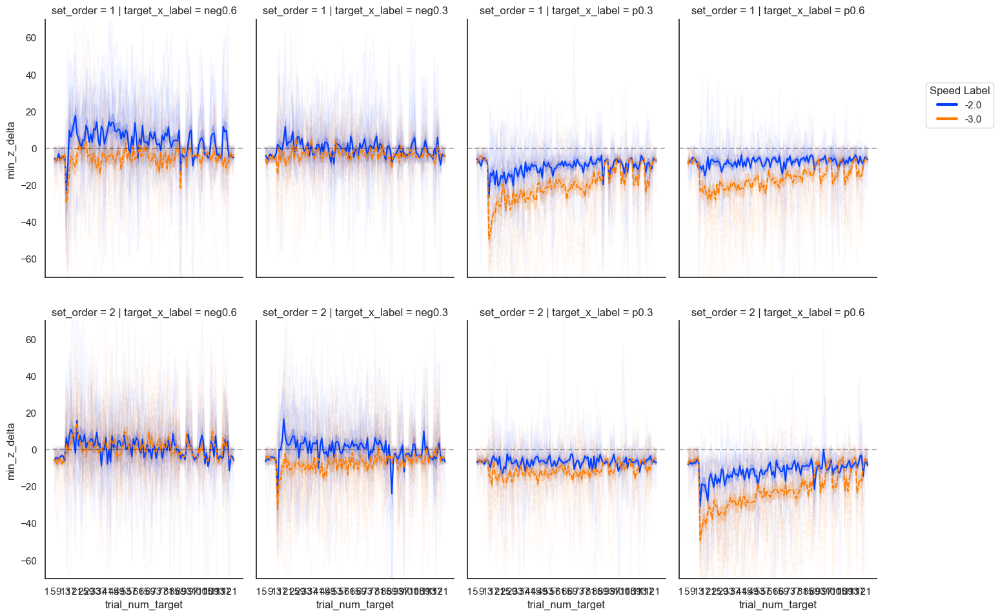

In [102]:
from src.plotting import plot_exposure_trials


plot_exposure_trials(df_filt_BC, 
                     cond_col='speed_label',
                     ppid_col='ppid_full',
                     y_col = 'min_z_delta', 
                     x_col='trial_num_target',
                     context='poster', 
                     font_scale=3,
                     marker_size=0,
                     estimator='mean',
                     y_lim=(-70,70),
                     show_zero_line=True
                    )

In [79]:
from src.plotting import plot_exposure_trials

plot_exposure_trials(training_df, 
                     cond_col='speed_label',
                     ppid_col='ppid_full',
                     y_col = 'min_distance_fixed_BC', 
                     x_col='phase_trial_target',
                     context='poster', 
                     font_scale=3, 
                     estimator='mean', 
                     y_lim=(0,110)
                    )

NameError: name 'training_df' is not defined

In [301]:
training_df['trial_target'].max()

75

In [55]:


plot_exposure_trials(training_df, 
                     cond_col='speed_label',
                     ppid_col='ppid_full',
                     y_col = 'baseline_corrected_x', 
                     x_col='phase_trial_target',
                     context='poster', 
                     font_scale=3, 
                     estimator='mean', 
                    y_lim=(-100.0,100.0))

NameError: name 'plot_exposure_trials' is not defined

In [297]:
training_df

,ppid_full,speed_label,trial_num,phase,trial_num_target,launch_deviation,launch_dev_z,launch_Speed,launch_Speed_z,ball_dist_to_center_cm,...,mean_ball_dist_cm,min_ball_dist_cm,mean_ball_dist_x_cm,mean_ball_launch_dev,mean_ball_launch_speed,min_distance_fixed_BC,baseline_corrected_x,baseline_corrected_dev,baseline_corrected_speed,phase_trial_target
18082,1_-3.0,-3.0,276,training_2,14,-68.315327,-2.221712,2.923085,-0.084788,32.156767,...,4.603806,0.000001,-0.403429,0.778439,1.607621,18.802961,-30.310871,-69.093766,1.315464,1
18084,1_-3.0,-3.0,278,training_2,15,-51.157677,-1.393299,4.036107,1.092576,77.759750,...,4.603806,0.000001,-0.403429,0.778439,1.607621,64.405944,69.964329,-51.936116,2.428486,2
18085,1_-3.0,-3.0,279,training_2,16,-66.361607,-2.127382,3.141253,0.145992,5.791449,...,4.603806,0.000001,-0.403429,0.778439,1.607621,-4.603805,9.468529,-67.140046,1.533632,3
18087,1_-3.0,-3.0,281,training_2,17,-63.344897,-1.981727,3.959993,1.012062,56.728746,...,4.603806,0.000001,-0.403429,0.778439,1.607621,43.374940,75.299329,-64.123336,2.352372,4
18089,1_-3.0,-3.0,283,training_2,18,-61.073727,-1.872070,3.362435,0.379960,39.603667,...,4.603806,0.000001,-0.403429,0.778439,1.607621,26.249861,34.831929,-61.852166,1.754814,5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
17534,p051_-2.0,-2.0,193,training_1,84,-31.808049,-0.451051,3.061696,0.896913,105.403211,...,4.360974,0.000001,-7.609500,2.081311,1.177750,92.292238,24.841400,-33.889360,1.883946,71
17536,p051_-2.0,-2.0,195,training_1,85,-26.903739,-0.216562,2.853493,0.594115,6.858610,...,4.360974,0.000001,-7.609500,2.081311,1.177750,-4.360973,13.841000,-28.985050,1.675743,72
17538,p051_-2.0,-2.0,197,training_1,86,-24.321999,-0.093122,3.003512,0.812294,8.229962,...,4.360974,0.000001,-7.609500,2.081311,1.177750,-4.360973,16.728500,-26.403310,1.825762,73
17540,p051_-2.0,-2.0,199,training_1,87,-24.603549,-0.106584,3.314532,1.264623,125.598500,...,4.360974,0.000001,-7.609500,2.081311,1.177750,112.487526,30.720500,-26.684860,2.136782,74


### GENERALIZATION

In [191]:

# makee exposure df with only early trial means
training_gen = early_late_4_means_euc[early_late_4_means_euc['section'] == 'early']

training_gen.head(8)

,ppid_full,section,target_x_label,set_order,phase,speed_label,mean_x_delta_cm,var_x_delta_cm,n
0,1_neg3,early,neg0.6,1,training_1,-3.0,-4.242729,261.007766,4
1,1_neg3,early,neg0.3,1,training_2,-3.0,10.527511,205.215118,4
2,1_neg3,early,p0.3,1,training_1,-3.0,-28.932525,106.564380,4
3,1_neg3,early,p0.6,1,training_2,-3.0,-29.572596,24.290918,4
8,p000_neg2,early,neg0.6,1,training_1,-2.0,-25.391650,229.270400,4
9,p000_neg2,early,neg0.3,1,training_2,-2.0,-23.696439,352.226265,4
10,p000_neg2,early,p0.3,1,training_1,-2.0,-56.161708,116.639707,4
11,p000_neg2,early,p0.6,1,training_2,-2.0,-32.125932,373.064878,4


In [87]:
# save exposure data to CSV; may not need if we can run R functions here...
training_gen.to_csv('training_gen_f4.csv', index=False)  


C:\Users\jacob\anaconda3\envs\water_current_project\lib\site-packages\seaborn\axisgrid.py:854: FutureWarning: 

Setting a gradient palette using color= is deprecated and will be removed in v0.14.0. Set `palette='dark:#4c72b0'` for the same effect.

  func(*plot_args, **plot_kwargs)
C:\Users\jacob\anaconda3\envs\water_current_project\lib\site-packages\seaborn\axisgrid.py:854: FutureWarning: 

Setting a gradient palette using color= is deprecated and will be removed in v0.14.0. Set `palette='dark:#4c72b0'` for the same effect.

  func(*plot_args, **plot_kwargs)
C:\Users\jacob\anaconda3\envs\water_current_project\lib\site-packages\seaborn\axisgrid.py:854: FutureWarning: 

Setting a gradient palette using color= is deprecated and will be removed in v0.14.0. Set `palette='dark:#4c72b0'` for the same effect.

  func(*plot_args, **plot_kwargs)
C:\Users\jacob\anaconda3\envs\water_current_project\lib\site-packages\seaborn\axisgrid.py:854: FutureWarning: 

Setting a gradient palette using color=

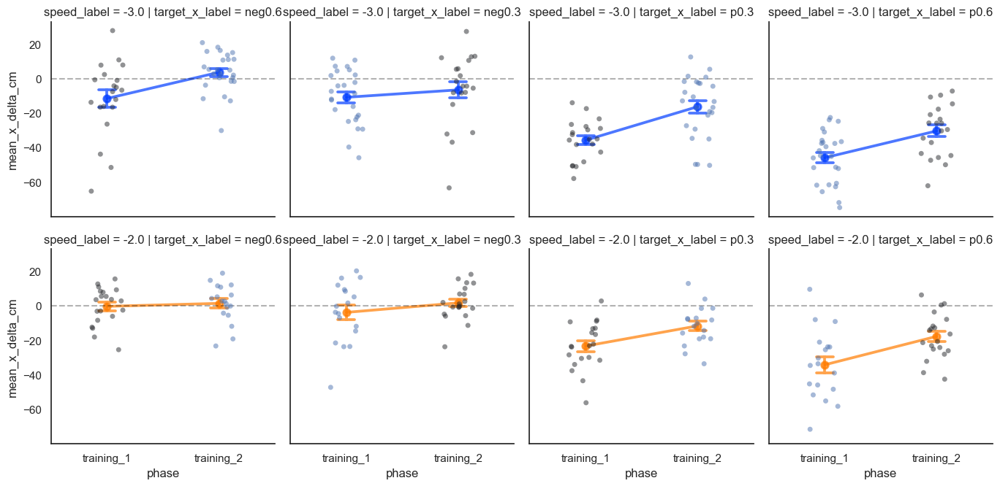

In [200]:
from src.plotting import plot_generalization

plot_generalization(training_gen, y_col='mean_x_delta_cm', context='poster', font_scale=3, cond_col='speed_label', show_zero_line=True)

In [ ]:
### WASHOUT

In [23]:
df_filt_BC.columns

Index(['ppid_full', 'speed_label', 'trial_num', 'phase', 'trial_num_target',
       'launch_deviation', 'launch_dev_z', 'launch_Speed', 'launch_Speed_z',
       'ball_dist_to_center_cm', 'min_x_delta', 'target_hit',
       'water_speed_binary', 'water_speed_m_s', 'target_x_label', 'sign_label',
       'set_order', 'ball_pos_x', 'ball_pos_z', 'min_pos_from_target_x',
       'min_pos_from_target_z', 'target_position_x', 'target_position_z',
       'target_angle_90', 'phase_str', 'ball_dist_to_center_cm_radii_fixed',
       'min_distance_fixed', 'log_min_distance_fixed', 'error_x_plane',
       'mean_ball_dist_cm', 'min_ball_dist_cm', 'mean_ball_dist_x_cm',
       'mean_ball_launch_dev', 'mean_ball_launch_speed',
       'min_distance_fixed_BC', 'baseline_corrected_x',
       'baseline_corrected_dev', 'baseline_corrected_speed'],
      dtype='object')

In [23]:
from src.filter_phase import filter_for_phase


baseline_tuple = filter_for_phase(df_filt_BC, 
                              phase_key=['base'], 
                              block=True, 
                              block_len = 4, 
                              inc_phase=True, 
                              ppid_col='ppid_full'
                             )


washout_tuple = filter_for_phase(df_filt_BC, 
                              phase_key=['wash'], 
                              block=True, 
                              block_len = 4, 
                              inc_phase=False, 
                              ppid_col='ppid_full'
                             )

C:\Users\jacob\water_current_MA\src\filter_phase.py:23: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  selected_phase['phase_trial_target'] = selected_phase.groupby([ppid_col, 'phase','target_x_label']).cumcount() + 1
C:\Users\jacob\water_current_MA\src\filter_phase.py:32: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  max_check = selected_phase.groupby([ppid_col,'target_x_label'])['phase_trial_target'].max()
C:\Users\jacob\water_current_MA\src\filter_phase.py:25: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain c

In [24]:
baseline_df = pd.DataFrame(baseline_tuple[0])
baseline_df

,ppid_full,speed_label,trial_num,phase,trial_num_target,launch_deviation,launch_dev_z,launch_Speed,launch_Speed_z,ball_dist_to_center_cm,...,min_ball_dist_cm,mean_ball_dist_x_cm,mean_ball_launch_dev,mean_ball_launch_speed,min_distance_fixed_BC,baseline_corrected_x,baseline_corrected_dev,baseline_corrected_speed,phase_trial_target,block
17991,1_neg3,-3.0,22,baseline,6,3.775109,1.258991,1.981875,-1.080407,10.446764,...,0.000001,-1.34635,1.458784,1.677042,-5.406550,-7.59135,2.316325,0.304833,1,1
17996,1_neg3,-3.0,27,baseline,7,-1.766991,0.991405,2.051739,-1.006504,7.327525,...,0.000001,-1.34635,1.458784,1.677042,-7.103313,8.15505,-3.225775,0.374696,2,1
17999,1_neg3,-3.0,30,baseline,8,12.744709,1.692065,1.007117,-2.111513,33.916175,...,0.000001,-1.34635,1.458784,1.677042,18.062861,-25.61425,11.285925,-0.669925,3,1
18004,1_neg3,-3.0,35,baseline,9,-7.199291,0.729120,2.060234,-0.997518,19.324776,...,0.000001,-1.34635,1.458784,1.677042,3.471462,21.10165,-8.658075,0.383191,4,1
18007,1_neg3,-3.0,38,baseline,10,9.742109,1.547092,1.254931,-1.849374,25.931159,...,0.000001,-1.34635,1.458784,1.677042,10.077845,-20.48055,8.283325,-0.422111,5,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
17527,p051_neg2,-2.0,34,baseline,9,8.940591,1.497254,1.320490,-1.635394,24.048858,...,0.000001,-4.83715,1.097764,1.152004,10.639335,-19.48235,7.842826,0.168486,4,1
17532,p051_neg2,-2.0,39,baseline,10,-0.983909,1.022736,1.189016,-1.826602,7.450965,...,0.000001,-4.83715,1.097764,1.152004,-4.659522,4.11585,-2.081674,0.037012,5,2
17537,p051_neg2,-2.0,44,baseline,11,1.285881,1.131261,1.046571,-2.033765,7.615424,...,0.000001,-4.83715,1.097764,1.152004,-4.659522,-1.07335,0.188116,-0.105433,6,2
17538,p051_neg2,-2.0,45,baseline,12,-4.977099,0.831811,1.261681,-1.720922,13.437593,...,0.000001,-4.83715,1.097764,1.152004,0.028071,16.46165,-6.074864,0.109677,7,2


In [45]:
washout_df = pd.DataFrame(washout_tuple[0])
washout_df

,ppid_full,speed_label,trial_num,phase,trial_num_target,launch_deviation,launch_dev_z,launch_Speed,launch_Speed_z,ball_dist_to_center_cm,...,min_ball_dist_cm,mean_ball_dist_x_cm,mean_ball_launch_dev,mean_ball_launch_speed,min_distance_fixed_BC,baseline_corrected_x,baseline_corrected_dev,baseline_corrected_speed,phase_trial_target,block
18166,1_neg3,-3.0,203,washout_1,89,-84.171841,-2.987303,3.423016,0.444043,207.145825,...,0.000001,-1.34635,1.458784,1.677042,191.292511,75.85285,-85.630625,1.745974,1,1
18168,1_neg3,-3.0,205,washout_1,90,-11.797291,0.507117,1.985536,-1.076534,31.384635,...,0.000001,-1.34635,1.458784,1.677042,15.531321,32.84565,-13.256075,0.308493,2,1
18170,1_neg3,-3.0,207,washout_1,91,4.436809,1.290939,1.935408,-1.129560,12.235550,...,0.000001,-1.34635,1.458784,1.677042,-3.617764,-8.85275,2.978025,0.258366,3,1
18173,1_neg3,-3.0,210,washout_1,92,-13.788551,0.410974,1.916293,-1.149780,36.469462,...,0.000001,-1.34635,1.458784,1.677042,20.616148,38.05305,-15.247335,0.239251,4,1
18174,1_neg3,-3.0,211,washout_1,93,-88.014971,-3.172859,3.392303,0.411555,34.401728,...,0.000001,-1.34635,1.458784,1.677042,18.548414,-2.56555,-89.473755,1.715261,5,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
17758,p051_neg2,-2.0,265,washout_1,120,-33.811189,-0.546826,2.969302,0.762541,6.911410,...,0.000001,-4.83715,1.097764,1.152004,-4.659522,12.62175,-34.908954,1.817298,32,8
17761,p051_neg2,-2.0,268,washout_1,121,-1.417579,1.002002,1.698061,-1.086277,6.997785,...,0.000001,-4.83715,1.097764,1.152004,-4.659522,5.08435,-2.515344,0.546057,33,9
17762,p051_neg2,-2.0,269,washout_1,122,1.317201,1.132759,1.614873,-1.207260,7.837088,...,0.000001,-4.83715,1.097764,1.152004,-4.659522,-1.33325,0.219436,0.462869,34,9
17764,p051_neg2,-2.0,271,washout_1,123,-0.199499,1.060241,1.641820,-1.168070,7.822133,...,0.000001,-4.83715,1.097764,1.152004,-4.659522,1.88965,-1.297264,0.489816,35,9


In [46]:
from src.remove_spillover import fix_washout_trials


washout_df_fixed = fix_washout_trials(
    washout_df
)

In [47]:
print(np.unique(washout_df_fixed['context_transition']))
washout_df_fixed.info()

[False  True]
<class 'pandas.core.frame.DataFrame'>
Index: 11888 entries, 18166 to 17767
Data columns (total 41 columns):
 #   Column                              Non-Null Count  Dtype   
---  ------                              --------------  -----   
 0   ppid_full                           11888 non-null  category
 1   speed_label                         11888 non-null  category
 2   trial_num                           11888 non-null  int32   
 3   phase                               11888 non-null  category
 4   trial_num_target                    11888 non-null  int32   
 5   launch_deviation                    11888 non-null  float64 
 6   launch_dev_z                        11888 non-null  float64 
 7   launch_Speed                        11888 non-null  float64 
 8   launch_Speed_z                      11888 non-null  float64 
 9   ball_dist_to_center_cm              11888 non-null  float64 
 10  min_x_delta                         11888 non-null  float64 
 11  target_hit     

In [231]:
washout_df_fixed.groupby(['block','water_speed_binary']).size()

block  water_speed_binary
1      0                     1324
2      0                        4
       1                      984
3      0                      994
       1                        1
4      0                        7
       1                      981
5      0                      994
       1                        3
6      0                        6
       1                      984
7      0                      985
       1                        6
8      0                       14
       1                      972
9      0                      978
dtype: int64

In [48]:
from src.remove_spillover import remove_spillover

washout_df_fixed = remove_spillover(washout_df_fixed)

In [49]:
washout_df_fixed = washout_df_fixed[~washout_df_fixed['is_spillover'] == True]

In [50]:
washout_df_fixed.groupby(['block','water_speed_binary']).size()

block  water_speed_binary
1      0                     1325
2      1                     1312
3      0                     1314
4      1                     1300
5      0                     1304
6      1                     1294
7      0                     1291
8      1                     1276
9      0                     1275
dtype: int64

In [51]:
len(baseline_df['phase'].unique()) > 1

False

In [52]:
len(washout_df_fixed['phase'].unique()) > 1

True

C:\Users\jacob\anaconda3\envs\water_current_project\lib\site-packages\seaborn\relational.py:313: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  for _, unit_data in sub_data.groupby("units"):
C:\Users\jacob\anaconda3\envs\water_current_project\lib\site-packages\seaborn\relational.py:313: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  for _, unit_data in sub_data.groupby("units"):
C:\Users\jacob\anaconda3\envs\water_current_project\lib\site-packages\seaborn\relational.py:313: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False t

36
[ 0  4  8 12 16 20 24 28 32 36]


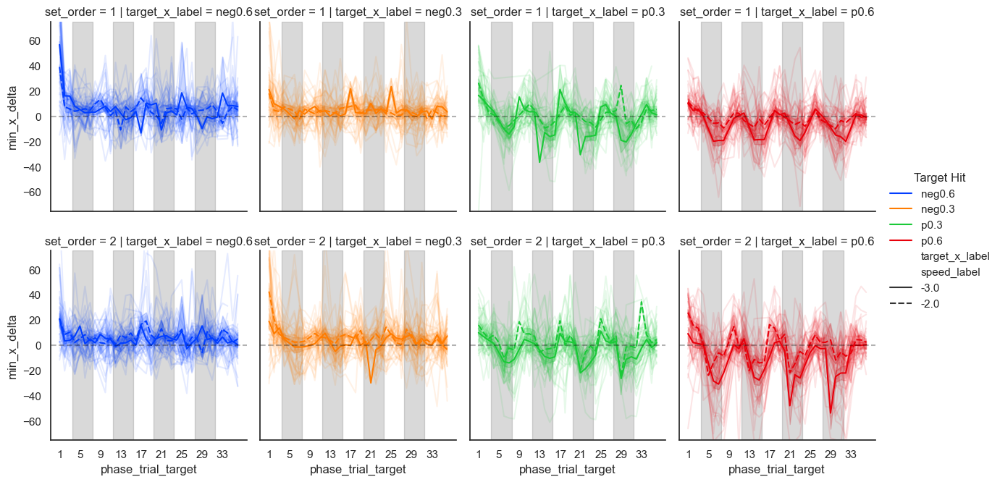

In [235]:
from src.plotting import plot_baseline_washout

plot_baseline_washout(washout_df_fixed,
                      ppid_col='ppid_full',
                      x_col='phase_trial_target',
                      y_col='min_x_delta',
                      y_lim=(-75,75),
                      start_trial=0,
                      block_len=4,
                      show_hits=False,
                      show_speeds=True,
                      marker_size=0,
                      speed_col='speed_label',
                      divide_phases=False
                     )

In [53]:
# combine baseline back with washout
from src.combine_non_col_aligned_dfs import combine_dfs

baseline_washout = combine_dfs(baseline_df, washout_df_fixed)

baseline_washout.to_csv(
    r"C:\Users\jacob\water_current_MA\data\baseline_washout.csv",
    index=False
)




C:\Users\jacob\water_current_MA\src\combine_non_col_aligned_dfs.py:24: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  df_cf['multi_phase_target_block'] = df_cf.groupby(['ppid_full','target_x_label']).cumcount() // 4
C:\Users\jacob\water_current_MA\src\combine_non_col_aligned_dfs.py:28: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.


In [37]:
baseline_washout_nw = baseline_washout[baseline_washout['water_speed_binary'] != 0]
baseline_washout_nw

,ppid_full,speed_label,trial_num,phase,trial_num_target,launch_deviation,launch_dev_z,launch_Speed,launch_Speed_z,ball_dist_to_center_cm,...,mean_ball_launch_dev,mean_ball_launch_speed,min_distance_fixed_BC,baseline_corrected_x,baseline_corrected_dev,baseline_corrected_speed,phase_trial_target,block,multi_phase_target_trial,multi_phase_target_block
2657,1_neg3,-3.0,213,washout_1,94,-92.556111,-3.392116,3.234118,0.244226,46.578751,...,1.458784,1.677042,30.725438,-5.68285,-94.014895,1.557076,6,2,12,2
2658,1_neg3,-3.0,216,washout_1,95,-76.124351,-2.598751,2.937854,-0.069165,3.136992,...,1.458784,1.677042,-7.103313,8.06955,-77.583135,1.260812,7,2,13,3
2659,1_neg3,-3.0,218,washout_1,96,-81.687131,-2.867335,3.046342,0.045595,31.455822,...,1.458784,1.677042,15.602508,-0.00305,-83.145915,1.369300,8,2,14,3
2663,1_neg3,-3.0,230,washout_1,102,-75.149271,-2.551672,3.479615,0.503914,44.737455,...,1.458784,1.677042,28.884141,7.47025,-76.608055,1.802572,14,4,18,4
2664,1_neg3,-3.0,231,washout_1,103,-81.064741,-2.837285,2.954533,-0.051522,32.958667,...,1.458784,1.677042,17.105353,-1.36795,-82.523525,1.277491,15,4,19,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
11839,p051_neg2,-2.0,248,washout_1,111,-20.248419,0.101647,2.422369,-0.032886,97.481201,...,1.097764,1.152004,84.071678,-16.84785,-21.346184,1.270365,23,6,26,6
11840,p051_neg2,-2.0,249,washout_1,112,-19.872459,0.119623,2.641177,0.285335,103.936134,...,1.097764,1.152004,90.526611,-8.33145,-20.970224,1.489173,24,6,27,6
11844,p051_neg2,-2.0,261,washout_1,118,-12.701219,0.462500,2.864636,0.610321,115.570548,...,1.097764,1.152004,102.161025,-11.20595,-13.798984,1.712632,30,8,31,7
11845,p051_neg2,-2.0,263,washout_1,119,-33.401519,-0.527239,2.770622,0.473592,6.965330,...,1.097764,1.152004,-4.659522,4.81685,-34.499284,1.618618,31,8,32,7


In [44]:
baseline_washout.columns

Index(['ppid_full', 'speed_label', 'trial_num', 'phase', 'trial_num_target',
       'launch_deviation', 'launch_dev_z', 'launch_Speed', 'launch_Speed_z',
       'ball_dist_to_center_cm', 'min_x_delta', 'target_hit',
       'water_speed_binary', 'water_speed_m_s', 'target_x_label', 'sign_label',
       'set_order', 'ball_pos_x', 'ball_pos_z', 'min_pos_from_target_x',
       'min_pos_from_target_z', 'target_position_x', 'target_position_z',
       'target_angle_90', 'phase_str', 'ball_dist_to_center_cm_radii_fixed',
       'min_distance_fixed', 'error_x_plane', 'mean_ball_dist_cm',
       'min_ball_dist_cm', 'mean_ball_dist_x_cm', 'mean_ball_launch_dev',
       'mean_ball_launch_speed', 'min_distance_fixed_BC',
       'baseline_corrected_x', 'baseline_corrected_dev',
       'baseline_corrected_speed', 'phase_trial_target', 'block',
       'multi_phase_target_trial', 'multi_phase_target_block'],
      dtype='object')

In [291]:
t['phase'].value_counts(dropna=False)

phase
washout_2     4612
washout_1     4584
baseline      2654
training_1       0
training_2       0
Name: count, dtype: int64

In [290]:
block_bounds = (
    t.groupby(['phase','block'])['multi_phase_target_trial']
        .agg(['min','max'])
        .reset_index()
)
print(block_bounds.head())


      phase  block  min  max
0  baseline      1  1.0  4.0
1  baseline      2  5.0  8.0
2  baseline      3  NaN  NaN
3  baseline      4  NaN  NaN
4  baseline      5  NaN  NaN


C:\Users\jacob\AppData\Local\Temp\ipykernel_35360\2133321979.py:2: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  t.groupby(['phase','block'])['multi_phase_target_trial']


C:\Users\jacob\anaconda3\envs\water_current_project\lib\site-packages\seaborn\relational.py:313: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  for _, unit_data in sub_data.groupby("units"):
C:\Users\jacob\anaconda3\envs\water_current_project\lib\site-packages\seaborn\relational.py:313: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  for _, unit_data in sub_data.groupby("units"):
C:\Users\jacob\anaconda3\envs\water_current_project\lib\site-packages\seaborn\relational.py:313: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False t

36


C:\Users\jacob\water_current_MA\src\plotting.py:609: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  hue = 'target_x_label', palette='bright', alpha=1, dashes=True)


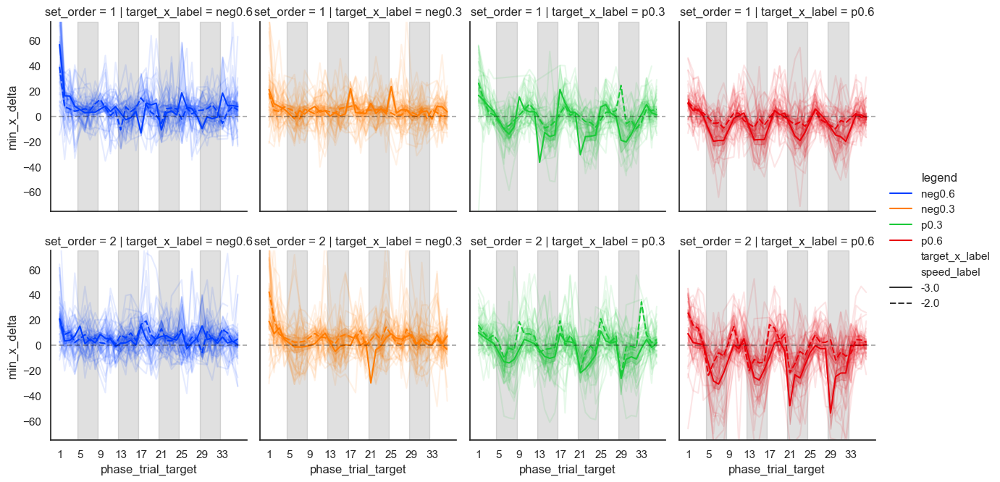

In [303]:
plot_baseline_washout(washout_df_fixed,
                      ppid_col='ppid_full',
                      x_col='phase_trial_target',
                      y_col='min_x_delta',
                      y_lim=(-75,75),
                      start_trial=8,
                      block_len=4,
                      show_hits=False,
                      show_speeds=True,
                      marker_size=0,
                      speed_col='speed_label',
                      divide_phases=False
                     )

In [56]:
baseline_washout_df['launch_deviation'] = -baseline_washout_df['launch_deviation']


C:\Users\jacob\anaconda3\envs\water_current_project\lib\site-packages\seaborn\relational.py:313: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  for _, unit_data in sub_data.groupby("units"):
C:\Users\jacob\anaconda3\envs\water_current_project\lib\site-packages\seaborn\relational.py:313: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  for _, unit_data in sub_data.groupby("units"):
C:\Users\jacob\anaconda3\envs\water_current_project\lib\site-packages\seaborn\relational.py:313: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False t

36


C:\Users\jacob\water_current_MA\src\plotting.py:609: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  hue = 'target_x_label', palette='bright', alpha=1, dashes=True)


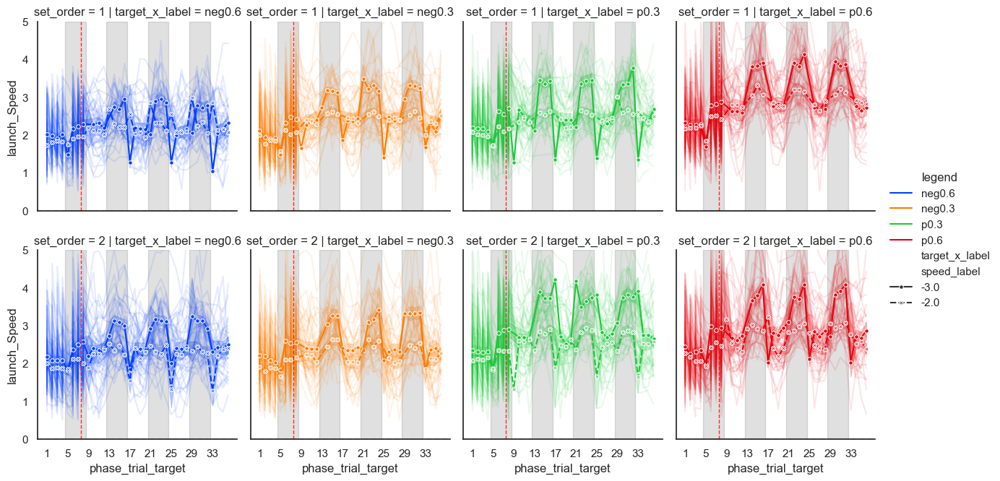

In [306]:
plot_baseline_washout(t,
                      x_col='phase_trial_target',
                      y_col='launch_Speed',
                      start_trial=8,
                      ppid_col='ppid_full',
                      y_lim=(0,5),
                      show_hits=False,
                      show_speeds=True,
                      speed_col='speed_label',
                      divide_phases=True
                     )

C:\Users\jacob\anaconda3\envs\water_current_project\lib\site-packages\seaborn\relational.py:313: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  for _, unit_data in sub_data.groupby("units"):
C:\Users\jacob\anaconda3\envs\water_current_project\lib\site-packages\seaborn\relational.py:313: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  for _, unit_data in sub_data.groupby("units"):
C:\Users\jacob\anaconda3\envs\water_current_project\lib\site-packages\seaborn\relational.py:313: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False t

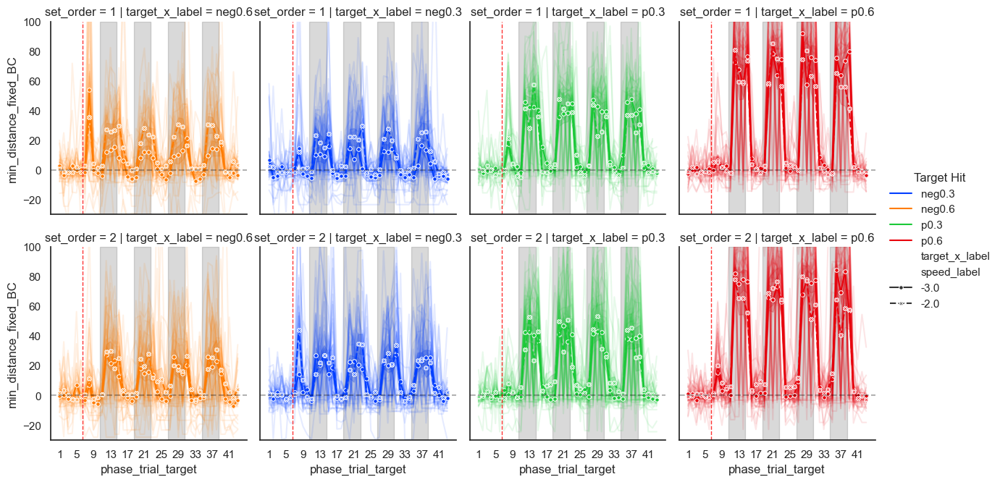

In [261]:

plot_baseline_washout(baseline_washout_df,
                      y_col='min_distance_fixed_BC',
                      ppid_col='ppid_full',
                      y_lim=(-30,100),
                      show_hits=False,
                      show_speeds=True,
                      speed_col='speed_label'
                     )

C:\Users\jacob\anaconda3\Lib\site-packages\seaborn\relational.py:313: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  for _, unit_data in sub_data.groupby("units"):
C:\Users\jacob\anaconda3\Lib\site-packages\seaborn\relational.py:313: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  for _, unit_data in sub_data.groupby("units"):
C:\Users\jacob\anaconda3\Lib\site-packages\seaborn\relational.py:313: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silenc

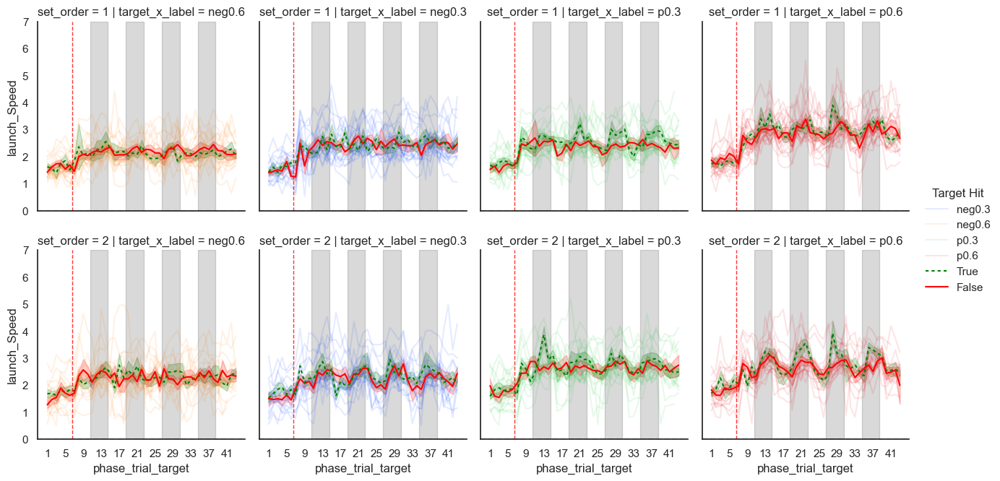

In [651]:
plot_baseline_washout(baseline_washout_df,
                      y_col='launch_Speed',
                      y_lim=(0,7),
                      marker_size=0,
                      show_hits=True
                     )

In [352]:
np.unique(baseline_washout_df['target_hit'])

array(['False', 'True'], dtype=object)

C:\Users\jacob\anaconda3\Lib\site-packages\seaborn\relational.py:313: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  for _, unit_data in sub_data.groupby("units"):
C:\Users\jacob\anaconda3\Lib\site-packages\seaborn\relational.py:313: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  for _, unit_data in sub_data.groupby("units"):
C:\Users\jacob\anaconda3\Lib\site-packages\seaborn\relational.py:313: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silenc

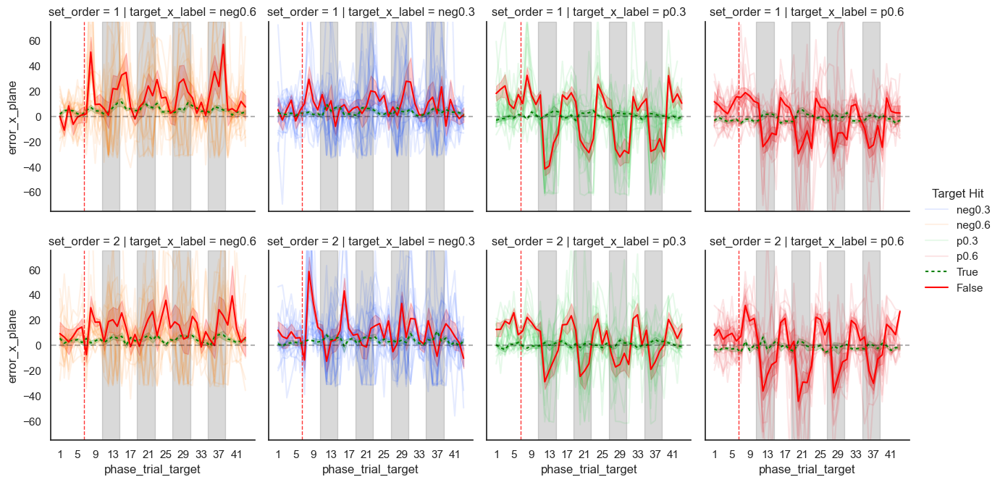

In [653]:
plot_baseline_washout(baseline_washout_df,
                      y_col='error_x_plane',
                      y_lim=(-75,75),
                      marker_size=0,
                      show_hits=True
                     )

In [397]:
baseline_washout_df['launch_deviation'] = -baseline_washout_df['launch_deviation']

C:\Users\jacob\anaconda3\Lib\site-packages\seaborn\relational.py:313: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  for _, unit_data in sub_data.groupby("units"):
C:\Users\jacob\anaconda3\Lib\site-packages\seaborn\relational.py:313: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  for _, unit_data in sub_data.groupby("units"):
C:\Users\jacob\anaconda3\Lib\site-packages\seaborn\relational.py:313: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silenc

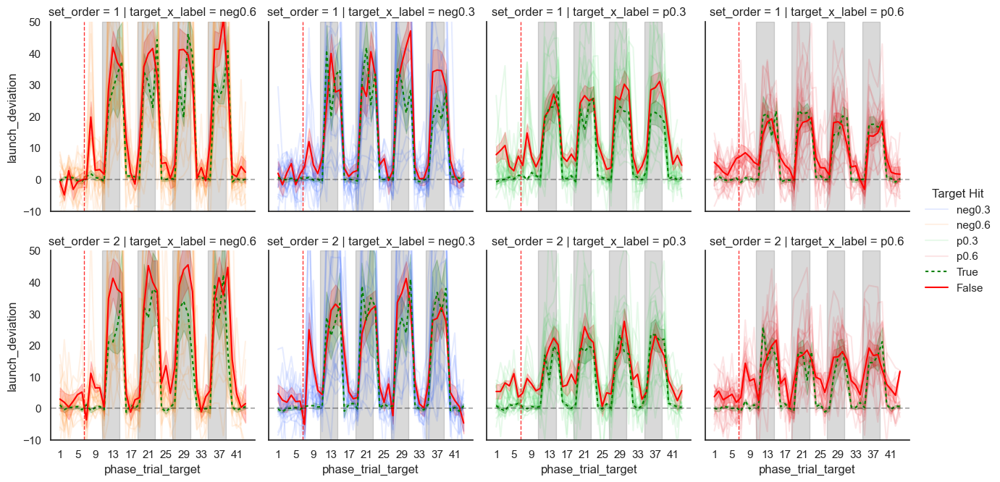

In [655]:
plot_baseline_washout(baseline_washout_df,
                      y_col='launch_deviation',
                      marker_size=0,
                      show_hits=True
                     )

In [ ]:
### ANOVAs

In [ ]:
### AUTOREGRESSIVE MODEL

In [52]:
# add standardized form of trial_num_target to df_small_filt


# df_no_baseline_wash_BC



df_no_baseline_wash_BC['trial_num_target_z'] = (df_no_baseline_wash_BC['trial_num_target'].mean() - df_no_baseline_wash_BC['trial_num_target']) / df_no_baseline_wash_BC['trial_num_target'].std()

#training_df['trial_num_target_z'] = (training_df['trial_num_target'].mean() - training_df['trial_num_target']) / training_df['trial_num_target'].std()


In [53]:
# trained vs transfer
df_no_baseline_wash_BC["training_phase1"] = df_no_baseline_wash_BC["phase"].isin(["training_1"])
df_no_baseline_wash_BC

# sign
df_no_baseline_wash_BC["sign"] = np.where(df_no_baseline_wash_BC["target_x_label"].str.contains("neg"), "left", "right")
df_no_baseline_wash_BC["sign"] = df_no_baseline_wash_BC["sign"].astype("category")


df_no_baseline_wash_BC['strategy_ratio'] = (
    df_no_baseline_wash_BC['launch_dev_z'].abs() /
    (df_no_baseline_wash_BC['launch_dev_z'].abs() + df_no_baseline_wash_BC['launch_Speed_z'].abs())
) # if strategy_ratio = 1.0, mostly came from angle changes

sr = df_no_baseline_wash_BC['strategy_ratio']
df_no_baseline_wash_BC['strategy_ratio_z'] = (sr - sr.mean()) / sr.std()

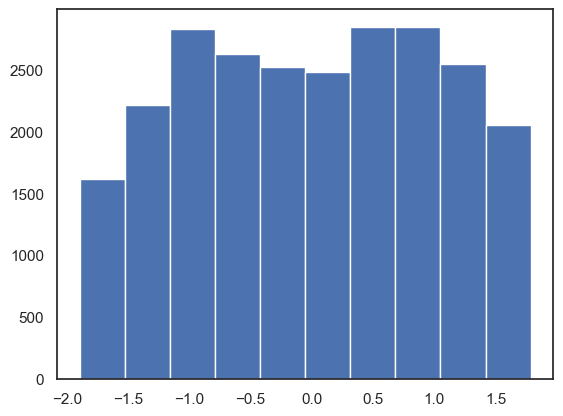

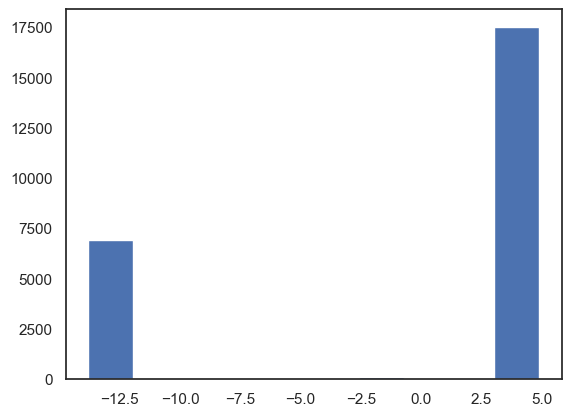

In [54]:
plt.hist(x=df_no_baseline_wash_BC['strategy_ratio_z'])
plt.show()
plt.hist(x=df_no_baseline_wash_BC['log_min_distance_fixed'])
plt.show()


(array([7055., 2618., 2292., 2725., 3161., 1056., 3335., 1360.,  638.,
         326.]),
 array([1.00000000e-06, 1.34783786e+01, 2.69567562e+01, 4.04351338e+01,
        5.39135115e+01, 6.73918891e+01, 8.08702667e+01, 9.43486443e+01,
        1.07827022e+02, 1.21305400e+02, 1.34783777e+02]),
 <BarContainer object of 10 artists>)

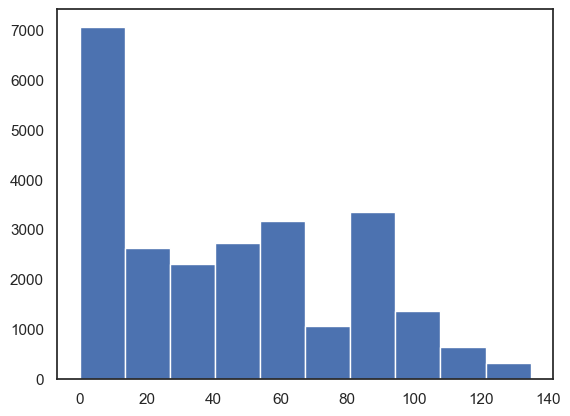

In [44]:
plt.hist(x=df_no_baseline_wash_BC['min_distance_fixed'])

In [39]:
df_small_filt['speed_label']

24      -2.0
25      -2.0
26      -2.0
27      -2.0
28      -2.0
        ... 
41160   -3.0
41161   -3.0
41162   -3.0
41163   -3.0
41164   -3.0
Name: speed_label, Length: 38776, dtype: category
Categories (2, float64): [-3.0, -2.0]

In [115]:
from src.design_matrix import build_design_matrix

X_sm, y, ppids = build_design_matrix(
    df_small_filt, 
    x_cols=['trial_num_target','launch_dev_z','launch_Speed_z'],
    y_col='min_x_delta',
    n_lag=[1,2,3],
    group_cols=['ppid_full','target_x_label','phase','set_order'], 
    x_dummys=['set_order','phase','target_x_label','speed_label','water_speed_binary'],
    interactions=[('launch_dev_z','launch_Speed_z')],
    add_constant=True
)


C:\Users\jacob\water_current_MA\src\design_matrix.py:33: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  
C:\Users\jacob\water_current_MA\src\design_matrix.py:33: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  
C:\Users\jacob\water_current_MA\src\design_matrix.py:33: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  


In [116]:
df_model = X_sm.copy()
df_model['min_x_delta'] = y
df_model['ppid'] = ppids.values

In [117]:
df_model = df_model.loc[:, ~df_model.columns.duplicated()]

In [118]:
df_model.columns = df_model.columns.str.replace(r'[^A-Za-z0-9_]+', '_', regex=True)

In [157]:
import statsmodels.formula.api as smf

formula = (
    "min_x_delta ~ "
    "trial_num_target + launch_dev_z + launch_Speed_z + "
    "min_x_delta_lag1 + min_x_delta_lag2 + min_x_delta_lag3 + "
    "phas_training_1 + phas_training_2 + phas_washout_1 + phas_washout_2 + "
    "targ_neg0_3 + targ_p0_3 + targ_p0_6 + "
    "spee__2_0 + wate_1 + set__2 + "
    "launch_dev_z_x_launch_Speed_z"
)

mixed_model = smf.mixedlm(
    formula,
    df_model,
    groups=df_model["ppid"] #,        
   # re_formula="~ trial_num_target" 
).fit()

print(mixed_model.summary())


C:\Users\jacob\anaconda3\envs\water_current_project\lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\jacob\anaconda3\envs\water_current_project\lib\site-packages\statsmodels\regression\mixed_linear_model.py:2200: ConvergenceWarning: Retrying MixedLM optimization with lbfgs
  warnings.warn(


                    Mixed Linear Model Regression Results
Model:                   MixedLM       Dependent Variable:       min_x_delta 
No. Observations:        35788         Method:                   REML        
No. Groups:              83            Scale:                    107.8917    
Min. group size:         371           Log-Likelihood:           -134713.6369
Max. group size:         436           Converged:                Yes         
Mean group size:         431.2                                               
-----------------------------------------------------------------------------
                               Coef.  Std.Err.    z     P>|z|  [0.025  0.975]
-----------------------------------------------------------------------------
Intercept                      24.452    0.669   36.555 0.000  23.141  25.763
set__2[T.1.0]                   0.009    0.654    0.014 0.989  -1.272   1.290
trial_num_target                0.029    0.003    9.080 0.000   0.022   0.035
launch

In [162]:
# Compute group means + SE for each phase
phase_summary = (
    df_small_filt
    .groupby("phase")["min_x_delta"]
    .agg(
        mean="mean",
        se=lambda x: x.std()/np.sqrt(len(x)),
        n="count"
    )
    .reset_index()
    .sort_values(by="phase", key=lambda x: x.map({
        "baseline":0, "training_1":1, "training_2":2, "washout_1":3, "washout_2":4
    }))
)

phase_summary


C:\Users\jacob\AppData\Local\Temp\ipykernel_15812\2544579155.py:4: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  .groupby("phase")["min_x_delta"]


,phase,mean,se,n
0,baseline,3.351161,0.319248,2322
1,training_1,-9.039635,0.189085,12181
2,training_2,-4.464334,0.153105,12385
3,washout_1,1.513534,0.259696,5932
4,washout_2,1.439482,0.215297,5956


In [155]:
import statsmodels.api as sm
import seaborn as sns
import matplotlib.pyplot as plt

def plot_acf_faceted(
    data,
    y_col='min_x_delta',
    r_col='set_order',
    c_col='target_x_label',
    hue_col='speed_label',
    lags=30,
    context='notebook',
    font_scale=3,
    save_path='../figures/acf_faceted.pdf',
    dpi=300
):

    sns.set_context(context, font_scale)
    sns.set_theme()
    sns.set_style("white")

    # Ensure categoricals for cleaner faceting
    for col in [r_col, c_col, hue_col]:
        if col in data.columns:
            data[col] = data[col].astype('category')

    # Hue mapping
    hue_levels = list(data[hue_col].cat.categories)
    palette = sns.color_palette("tab10", len(hue_levels))
    color_map = dict(zip(hue_levels, palette))

    g = sns.FacetGrid(
        data,
        row=r_col,
        col=c_col,
        sharex=False,
        sharey=False,
        margin_titles=True
    )

    # Correct function signature
    def _acf_plot(data, **kwargs):
        ax = plt.gca()
        for level in hue_levels:
            series = data.loc[data[hue_col] == level, y_col].dropna()
            if len(series) == 0:
                continue
            sm.graphics.tsa.plot_acf(
                series,
                lags=lags,
                ax=ax,
                alpha=0.05,
                zero=False,
                color=color_map[level]
            )
        ax.set_xlabel("Lag")
        ax.set_ylabel("ACF")

    g.map_dataframe(_acf_plot)

    # Facet titles
    g.set_titles(col_template="Target = {col_name}",
                 row_template="Set Order = {row_name}")

    # Legend
    handles = [plt.Line2D([0],[0], color=color_map[h], lw=3) for h in hue_levels]
    labels = [f"{hue_col} = {h}" for h in hue_levels]
    g.fig.legend(
        handles, labels,
        title="Water Speed",
        loc="upper right",
        bbox_to_anchor=(1.1, 0.95)
    )

    g.fig.set_size_inches(16, 10)

    if save_path:
        g.fig.savefig(save_path, dpi=dpi, bbox_inches="tight")

    plt.show()
    return g


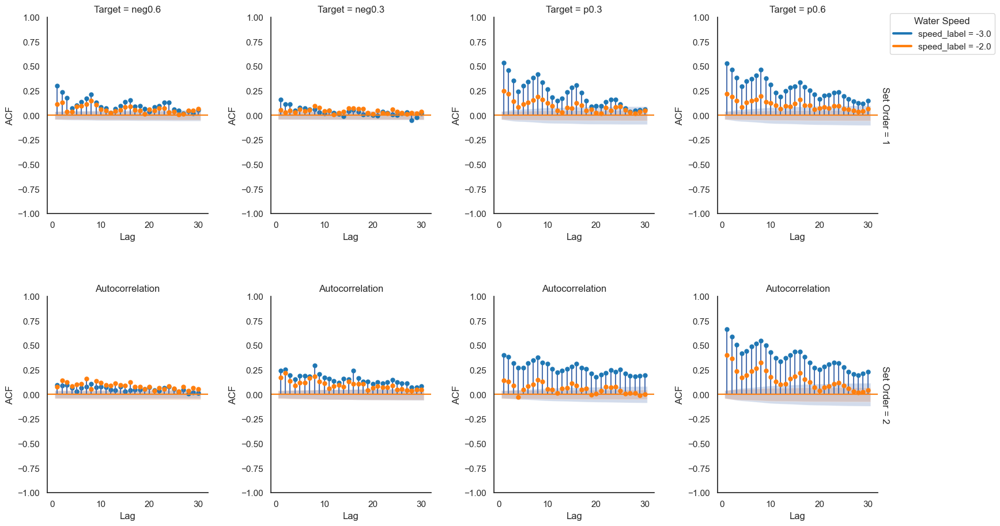

In [156]:
plot_acf_faceted(df_small_filt, y_col="min_x_delta")

In [38]:
training_df['speed_label']

NameError: name 'training_df' is not defined

In [112]:

import rpy2.robjects as ro
from rpy2.robjects import pandas2ri

pandas2ri.activate()

#ro.globalenv["df_no_baseline_wash_BC_R"] = pandas2ri.py2rpy(df_no_baseline_wash_BC) # df_no_baseline_BC
ro.globalenv["training_df_R"] = pandas2ri.py2rpy(training_df)


C:\Users\jacob\anaconda3\envs\water_current_project\lib\site-packages\rpy2\robjects\pandas2ri.py:65: UserWarning: Error while trying to convert the column "speed_label". Fall back to string conversion. The error is: Converting pandas "Category" series to R factor is only possible when categories are strings.
  warnings.warn('Error while trying to convert '


In [56]:
## final look at pandas df:
df_no_baseline_wash_BC['log_min_distance_fixed'].head(8)

27     4.122005
28     3.719604
29     3.978875
30     4.178000
31     4.246413
32     3.433250
33     3.960821
34   -13.815511
Name: log_min_distance_fixed, dtype: float64

In [62]:
df_no_baseline_wash_BC['speed_label']

27      -2.0
28      -2.0
29      -2.0
30      -2.0
31      -2.0
        ... 
38699   -3.0
38700   -3.0
38701   -3.0
38702   -3.0
38703   -3.0
Name: speed_label, Length: 24566, dtype: category
Categories (2, float64): [-3.0, -2.0]

In [ ]:
%%R



In [57]:
%%R
df_no_baseline_wash_BC_R$ppid <- factor(df_no_baseline_wash_BC_R$ppid)
df_no_baseline_wash_BC_R$sign <- factor(df_no_baseline_wash_BC_R$sign)


df_no_baseline_wash_BC_R$set_order <- factor(df_no_baseline_wash_BC_R$set_order)

df_no_baseline_wash_BC_R$training_phase1 <-factor(df_no_baseline_wash_BC_R$training_phase1,
           levels = c(TRUE, FALSE))

df_no_baseline_wash_BC_R$target_x_label <- factor(df_no_baseline_wash_BC_R$target_x_label)

df_no_baseline_wash_BC_R$water_speed_binary <- factor(df_no_baseline_wash_BC_R$water_speed_binary)


# set p0.6 as the reference level
df_no_baseline_wash_BC_R$target_x_label <- relevel(
  df_no_baseline_wash_BC_R$target_x_label,
  ref = "p0.6"
)


#df_no_baseline_wash_BC_R$log_y <- log(df_no_baseline_wash_BC_R$min_distance_fixed + 1e-6)


In [64]:
print('test')

test


In [58]:
%%R 

library(lme4)

m_strat <- lmer(
  strategy_ratio ~ 
    target_x_label * training_phase1 +
    (1 + trial_num_target_z | ppid),
  data = df_no_baseline_wash_BC_R
)

summary(m_strat)



Linear mixed model fit by REML ['lmerMod']
Formula: 
strategy_ratio ~ target_x_label * training_phase1 + (1 + trial_num_target_z |  
    ppid)
   Data: df_no_baseline_wash_BC_R

REML criterion at convergence: -1974.4

Scaled residuals: 
    Min      1Q  Median      3Q     Max 
-3.3440 -0.6895  0.0158  0.7024  3.1245 

Random effects:
 Groups   Name               Variance Std.Dev. Corr 
 ppid     (Intercept)        0.011582 0.10762       
          trial_num_target_z 0.001427 0.03778  -0.35
 Residual                    0.052773 0.22972       
Number of obs: 24566, groups:  ppid, 83

Fixed effects:
                                           Estimate Std. Error t value
(Intercept)                                0.465486   0.016006  29.083
target_x_labelneg0.3                       0.127289   0.005783  22.012
target_x_labelneg0.6                       0.215822   0.023047   9.364
target_x_labelp0.3                         0.058131   0.023062   2.521
training_phase1FALSE                     

In [63]:
%%R

library(lme4)

# Model 1 (reference p0.6)
m_log <- lmer(
  log_min_distance_fixed ~ 
    target_x_label * training_phase1 +
    strategy_ratio_z * training_phase1 +
    (1 + trial_num_target_z | ppid),
  data = df_no_baseline_wash_BC_R
)

print("Mod1: Reference p0.6")
print(summary(m_log))

[1] "Mod1: Reference p0.6"
Linear mixed model fit by REML ['lmerMod']
Formula: 
log_min_distance_fixed ~ target_x_label * training_phase1 + speed_label +  
    strategy_ratio_z * training_phase1 + (1 + trial_num_target_z |      ppid)
   Data: df_no_baseline_wash_BC_R

REML criterion at convergence: 169931.6

Scaled residuals: 
    Min      1Q  Median      3Q     Max 
-2.2402 -1.1709  0.4525  0.6951  1.7402 

Random effects:
 Groups   Name               Variance Std.Dev. Corr 
 ppid     (Intercept)         1.7002  1.3039        
          trial_num_target_z  0.3822  0.6182   -0.42
 Residual                    58.4523  7.6454        
Number of obs: 24566, groups:  ppid, 83

Fixed effects:
                                          Estimate Std. Error t value
(Intercept)                                1.29250    0.28598   4.520
target_x_labelneg0.3                      -3.29593    0.19587 -16.827
target_x_labelneg0.6                      -3.87154    0.33916 -11.415
target_x_labelp0.3      

In [216]:
from rpy2.robjects import r
from rpy2.robjects import pandas2ri
pandas2ri.activate()


In [217]:
%%R
# extract values (log scale)
df_no_baseline_wash_BC_R$fit_log <- fitted(m_log)
df_no_baseline_wash_BC_R$fit_strat <- fitted(m_strat)


# convert back to raw scale
df_no_baseline_wash_BC_R$fit_raw <- exp(df_no_baseline_wash_BC_R$fit_log)


df_pred <- df_no_baseline_wash_BC_R


In [218]:
df_pred = pandas2ri.rpy2py(r['df_pred']) # extract model fit output


In [219]:
df_pred.info()

<class 'pandas.core.frame.DataFrame'>
Index: 13241 entries, 28 to 20865
Data columns (total 41 columns):
 #   Column                              Non-Null Count  Dtype  
---  ------                              --------------  -----  
 0   ppid                                13241 non-null  int64  
 1   trial_num                           13241 non-null  int64  
 2   phase                               13241 non-null  int64  
 3   trial_num_target                    13241 non-null  int64  
 4   launch_deviation                    13241 non-null  float64
 5   launch_dev_z                        13241 non-null  float64
 6   launch_Speed                        13241 non-null  float64
 7   launch_Speed_z                      13241 non-null  float64
 8   ball_dist_to_center_cm              13241 non-null  float64
 9   target_hit                          13241 non-null  object 
 10  water_speed_binary                  13241 non-null  int64  
 11  water_speed_m_s                     13241 non

In [220]:
label_map = {
    1: "neg0.6",
    2: "neg0.3",
    3: "p0.3",
    4: "p0.6"
}

df_pred['target_x_label'] = (
    df_pred['target_x_label']
    .map(label_map)
    .astype('category')
)

In [248]:
from src.plotting import plot_exposure_trials


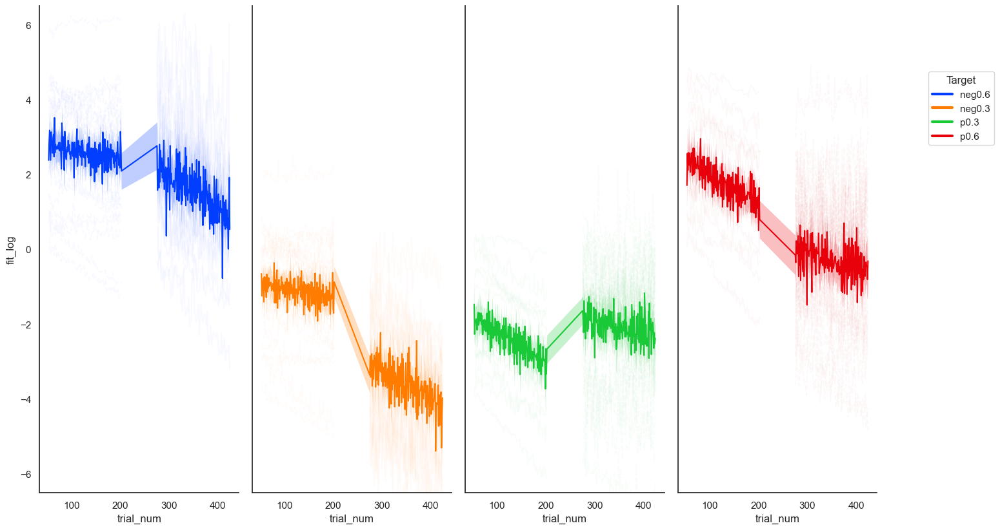

In [234]:
plot_exposure_trials(data=df_pred,
                     y_col='fit_log',
                     y_lim=(-6.5,6.5),
                     x_col='trial_num'
                    )

In [172]:
df_pred.groupby(['target_x_label'])['trial_num'].nunique()


C:\Users\jacob\AppData\Local\Temp\ipykernel_21584\2625643906.py:1: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  df_pred.groupby(['target_x_label'])['trial_num'].nunique()


target_x_label
1    300
2    300
3    300
4    300
Name: trial_num, dtype: int64

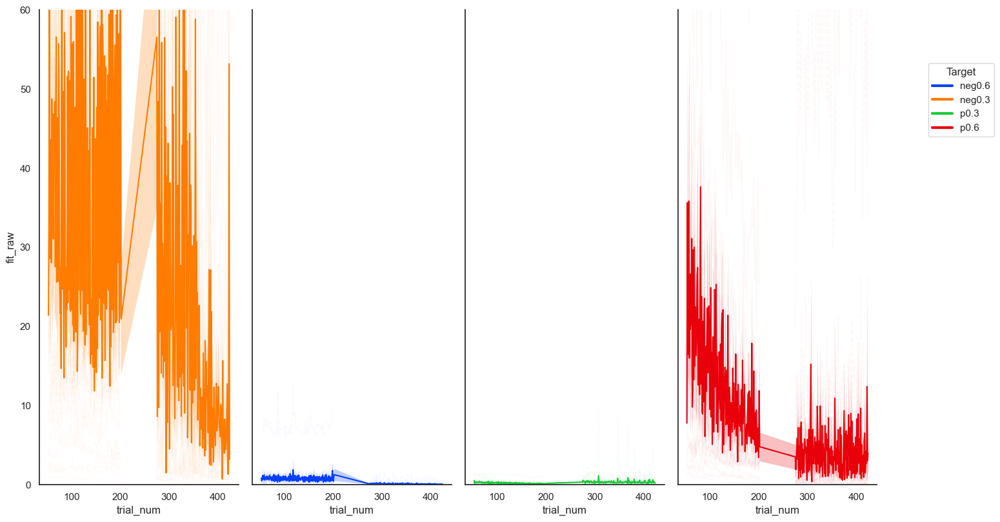

In [196]:
plot_exposure_trials(data=df_pred,
                     y_col='fit_raw',
                     y_lim=(0,60),
                     x_col='trial_num'
                    )

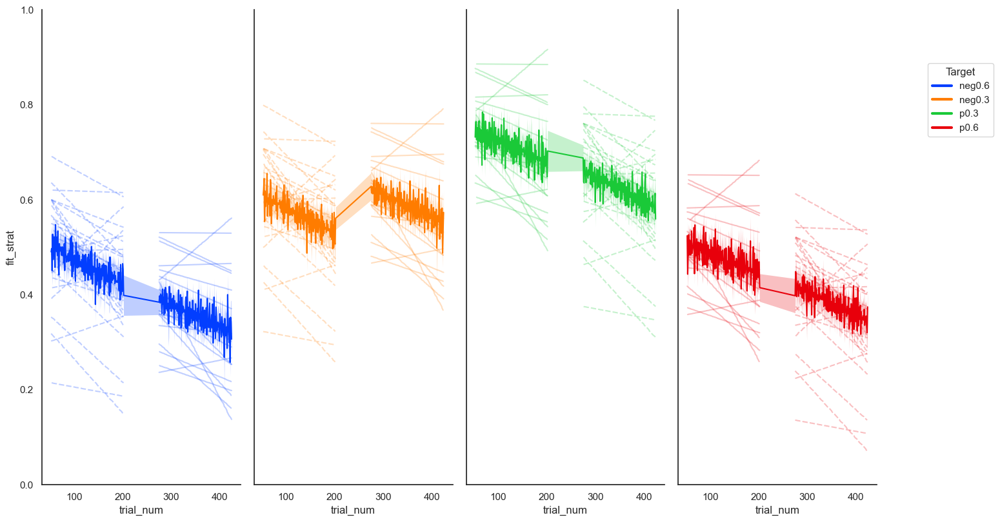

In [240]:
plot_exposure_trials(data=df_pred,
                     y_col='fit_strat',
                     y_lim=(0.0,1.0),
                     x_col='trial_num'
                    )

C:\Users\jacob\anaconda3\envs\water_current_project\lib\site-packages\seaborn\relational.py:313: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  for _, unit_data in sub_data.groupby("units"):
C:\Users\jacob\anaconda3\envs\water_current_project\lib\site-packages\seaborn\relational.py:313: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  for _, unit_data in sub_data.groupby("units"):
C:\Users\jacob\anaconda3\envs\water_current_project\lib\site-packages\seaborn\relational.py:313: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False t

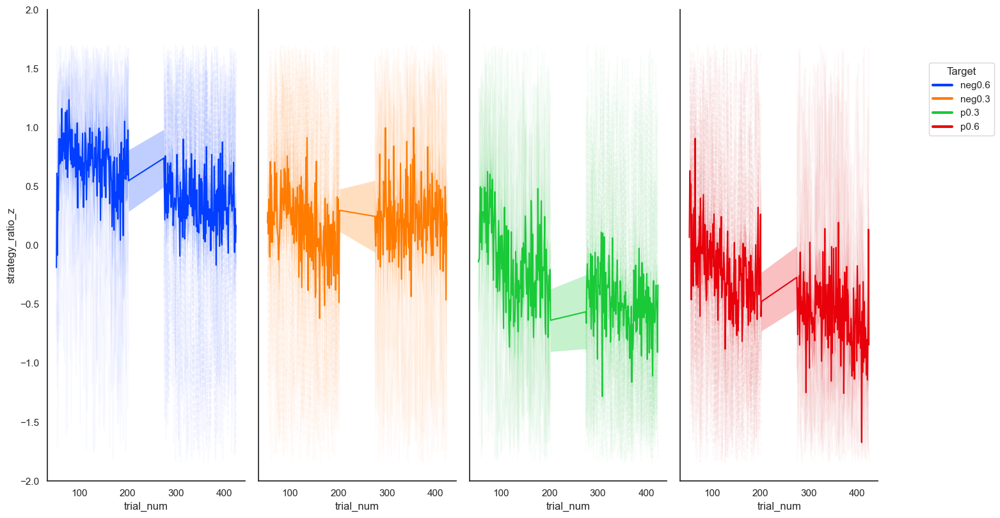

In [247]:
plot_exposure_trials(data=df_no_baseline_wash_BC,
                     y_col='strategy_ratio_z',
                     y_lim=(-2,2),
                     x_col='trial_num'
                    )

In [250]:
%%R

library(lme4)

# Model 1 (reference p0.6)
m_strat2 <- lmer(
  strategy_ratio_z ~ 
    target_x_label * training_phase1 *
    set_order +
    (1 | ppid),
  data = df_no_baseline_wash_BC_R
)

print(summary(m_strat2))



R[write to console]: fixed-effect model matrix is rank deficient so dropping 8 columns / coefficients



Linear mixed model fit by REML ['lmerMod']
Formula: strategy_ratio_z ~ target_x_label * training_phase1 * set_order +  
    (1 | ppid)
   Data: df_no_baseline_wash_BC_R

REML criterion at convergence: 33204.5

Scaled residuals: 
    Min      1Q  Median      3Q     Max 
-3.1820 -0.7080  0.0103  0.7312  3.0436 

Random effects:
 Groups   Name        Variance Std.Dev.
 ppid     (Intercept) 0.1377   0.3710  
 Residual             0.7072   0.8409  
Number of obs: 13241, groups:  ppid, 45

Fixed effects:
                                          Estimate Std. Error t value
(Intercept)                               -0.22354    0.08556  -2.613
target_x_labelneg0.3                       0.38319    0.02790  13.733
target_x_labelneg0.6                       0.90544    0.03024  29.938
target_x_labelp0.3                         0.07589    0.02094   3.624
training_phase1FALSE                      -0.35487    0.02094 -16.948
set_order2                                 0.01668    0.11326   0.147
target

In [255]:
%%R

library(lme4)

# Model 1 (reference p0.6)
m_gen2 <- lmer(
  log_min_distance_fixed  ~ 
     training_phase1 *
    set_order + set_order * target_x_label +
    (1 | ppid),
  data = df_no_baseline_wash_BC_R
)

print(summary(m_gen2))



R[write to console]: fixed-effect model matrix is rank deficient so dropping 2 columns / coefficients



Linear mixed model fit by REML ['lmerMod']
Formula: log_min_distance_fixed ~ training_phase1 * set_order + set_order *  
    target_x_label + (1 | ppid)
   Data: df_no_baseline_wash_BC_R

REML criterion at convergence: 90180.3

Scaled residuals: 
    Min      1Q  Median      3Q     Max 
-2.5206 -0.2050  0.4022  0.6773  1.4686 

Random effects:
 Groups   Name        Variance Std.Dev.
 ppid     (Intercept)  2.265   1.505   
 Residual             52.660   7.257   
Number of obs: 13241, groups:  ppid, 45

Fixed effects:
                                Estimate Std. Error t value
(Intercept)                       3.1865     0.3820   8.343
training_phase1FALSE             -1.6100     0.1807  -8.911
set_order2                       -0.5679     0.4863  -1.168
target_x_labelneg0.3             -5.1889     0.2657 -19.530
target_x_labelneg0.6             -5.5907     0.2610 -21.423
target_x_labelp0.3               -1.2971     0.1807  -7.179
set_order2:target_x_labelneg0.3   1.4771     0.3586   4.11